# Sales Prediction using RNN algorithm

## Load required libraries

In [1]:
import boto3
import s3fs
import sagemaker
import json
from sagemaker import get_execution_role
from sklearn.metrics import mean_squared_error
from math import sqrt

In [4]:
from matplotlib import pyplot as plt 
from shapely.geometry import Point
# import geopandas as gpd
# from geopandas import GeoDataFrame
import boto3
import matplotlib.image as mpimg
import numpy as np
import csv
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import mean_squared_error
import os
# import folium

%matplotlib inline

In [5]:
def get_file_path_list(path):  
    full_path_list = []
    for path, subdirs, files in os.walk(path):
        for filename in files:
            f = os.path.join(path, filename)
            full_path_list.append(f)
    return full_path_list

In [6]:
def series_to_obj(ts, cat=None):
    obj = {"start": str(ts.index[0]), "target": list(ts)}
    if cat is not None:
        obj["cat"] = cat
    return obj

def series_to_jsonline(ts, cat=None):
    return json.dumps(series_to_obj(ts, cat))

## Download data from s3 to Sagemaker instance

In [8]:
BUCKET_NAME = 'wb-data-lake-forcise-aws-copy'
s3 = boto3.resource('s3')

bucket_list = []
for key in s3.Bucket(BUCKET_NAME).objects.all():
    bucket_list.append(key.key)
    
files = [f for f in bucket_list if ('part' in f and 'pos_data_transactional' in f)]

for i in range(len(files)):
    s3.Bucket(BUCKET_NAME).download_file(files[i], 'Data/'+files[i].split('/')[-2])

### Group from transactions to daily level

In [572]:
file_names = get_file_path_list('Data')

df2 = pd.DataFrame()
cols = ['bar_id','order_time','sales_before_tax']
for file_name in file_names:
    dftemp = pd.read_parquet(file_name, engine='pyarrow')
    dftemp = dftemp[cols]
    for barid in dftemp['bar_id'].unique():
        dftemp_sub = dftemp[dftemp['bar_id']==barid]
        dftemp_sub.set_index('order_time', inplace=True)
        dftemp_sub = dftemp_sub.resample("d").agg({'sales_before_tax':np.sum,'bar_id':'last'})
        df2 = pd.concat([df2,dftemp_sub], axis=0)

### Filter out data beyond 2017/11/01 and 2019/03/04

In [31]:
df2 = pd.read_csv('df2.csv', index_col= 'order_time')
df2.index = pd.to_datetime(df2.index)

In [38]:
df = df2.reset_index()
df = df[df['order_time'].isin(pd.date_range(start='20171101', end='20190304'))]
df.set_index('order_time', inplace=True)

### Get bar list

In [39]:
df.dropna(inplace= True)
df['bar_id'] = df['bar_id'].astype(int)
bar_list = [int(i) for i in df.bar_id.unique() if str(i) != 'nan']
print(bar_list)
bar_list = list(set(bar_list))


[10834, 4689, 12258, 1154, 4686, 4685, 17650, 1278, 4683, 4678, 2871, 2453, 4684, 4679, 1269, 1279, 4144, 4151, 3504, 4328, 1276, 16988, 1177, 2748, 7468, 2282, 12573, 2441, 1170, 3162, 4242, 10833, 7268, 2843, 2609, 2476, 2890, 17895, 19142, 12248, 7127, 2869, 3002, 1155, 17271, 3578, 5187, 1159, 10526, 7015, 4676, 1157, 10840, 17125, 16984, 10917, 4682, 2449, 3379, 13023, 7213, 2870, 7028, 7206, 4241, 4143, 12543, 3783, 1270, 7199, 1179, 2818, 2619, 4054, 2889, 2691, 2868, 7469, 2566, 17199, 17200, 16987, 19088, 17147, 19513, 12536, 1173, 19521, 23208, 19195, 7102, 13028, 19509, 19205, 7100, 7106, 11773, 2483, 4677, 17014, 19201]


In [40]:
len(bar_list)

101

### Put data in a dictionary, one element for each bar. Also aggregate data from multiple rows with same day into one

In [41]:
bar_dict = {str(k): [] for k in (bar_list)}
for bar in bar_list:
    bar_1 = df[df['bar_id']== bar]
    bar_1 = bar_1.resample("d").agg({'sales_before_tax':np.sum,'bar_id':'last'})
    bar_1.sort_index(inplace=True)
    bar_1.dropna(inplace= True)
    bar_1['bar_id'] = bar_1['bar_id'].astype(int)
    bar_dict[str(bar)].append(bar_1)


In [42]:
len([*bar_dict])

101

In [43]:
for key in bar_dict.keys():
    a = bar_dict[key][0]
    print(len(a))

463
353
266
355
485
488
178
103
466
45
409
88
446
487
228
487
482
486
487
301
301
304
295
286
298
282
146
485
127
147
359
102
487
487
484
487
487
124
482
455
460
479
476
485
269
68
487
246
378
142
106
148
486
489
161
479
458
126
120
478
123
487
151
487
74
485
98
485
177
195
270
195
120
131
487
487
487
480
487
487
487
376
373
161
479
488
440
485
374
323
274
87
73
72
481
349
222
237
140
483
83


### Delete bars with data recorded after 2017,12,29, or have a lot of missing data (less than 487 days)

In [44]:
bar_dict2 = bar_dict.copy()
for key in bar_dict.keys():
    a = bar_dict[key][0]
    a = a.reset_index()
    b = pd.Timestamp(2017,12,29) <= a.loc[0,['order_time']]
    if (b.any() or len(a)< 460):
#     if b.any():
        del bar_dict2[key]

In [45]:
for key in bar_dict2.keys():
    a = bar_dict2[key][0]
    print(len(a))

463
485
488
466
487
487
482
486
487
485
487
487
484
487
487
482
460
479
476
485
487
486
489
479
478
487
487
485
485
487
487
487
480
487
487
487
479
488
485
481
483


In [46]:
len([*bar_dict2])

41

### Get new bar list with enough data

In [48]:
new_bar_list = [*bar_dict2]

### Interpolate to have data for all days between min and max dates for each bar

In [49]:
min_date = []
max_date = []

new_bar_dict = {str(k): [] for k in (new_bar_list)}

for bar in new_bar_list:
    bar_1 = bar_dict2[bar][0]
    idx = pd.date_range(bar_1.index[0], bar_1.index[-1])
    bar_1.index = pd.DatetimeIndex(bar_1.index)
    bar_1 = bar_1.reindex(idx, fill_value=np.nan)
    bar_1 = bar_1.apply(pd.to_numeric)
    bar_1 = bar_1.fillna(bar_1.mean())
    mindate = bar_1.index[0]
    maxdate = bar_1.index[-1]   
    min_date.append(mindate)
    max_date.append(maxdate)
    new_bar_dict[str(bar)].append(bar_1)

### Final filtering. Getting everything in the new_bar_dict2 dictionary

In [50]:
new_bar_dict2 = new_bar_dict.copy()
for key in new_bar_dict.keys():
    a = new_bar_dict[key][0]
    if len(a)< 489:
        del new_bar_dict2[key]

### Left with only 36 bars! they all have 489 days of data

In [51]:
len([*new_bar_dict2])

36

In [52]:
for key in new_bar_dict2.keys():
    a = new_bar_dict2[key][0]
    print(len(a))

489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489
489


/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


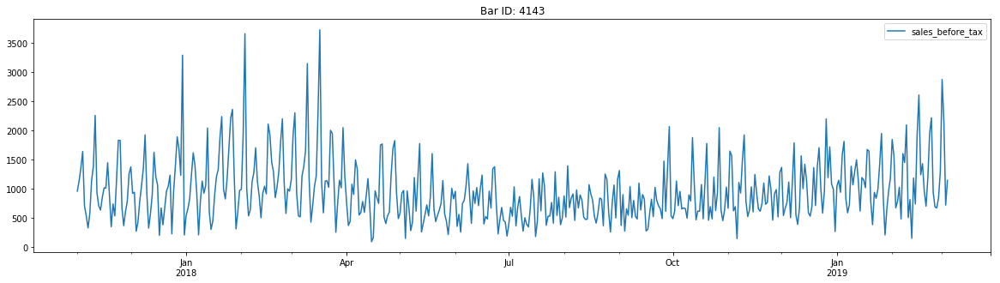

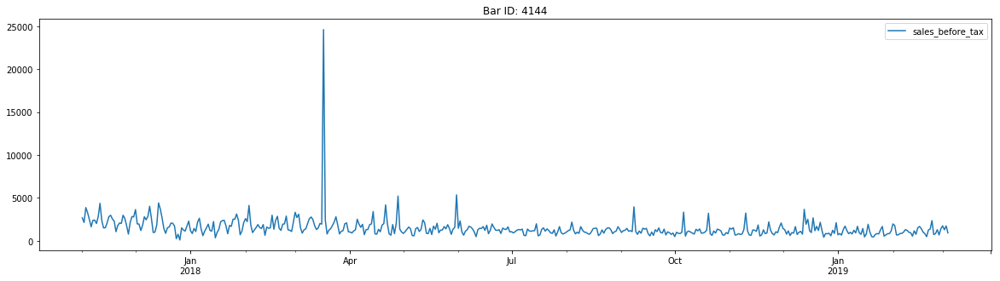

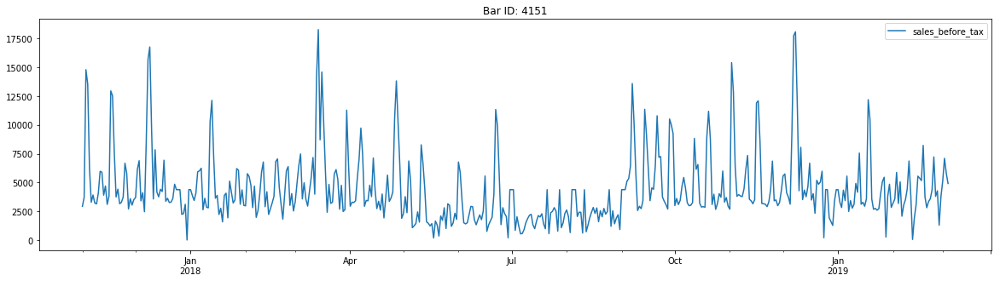

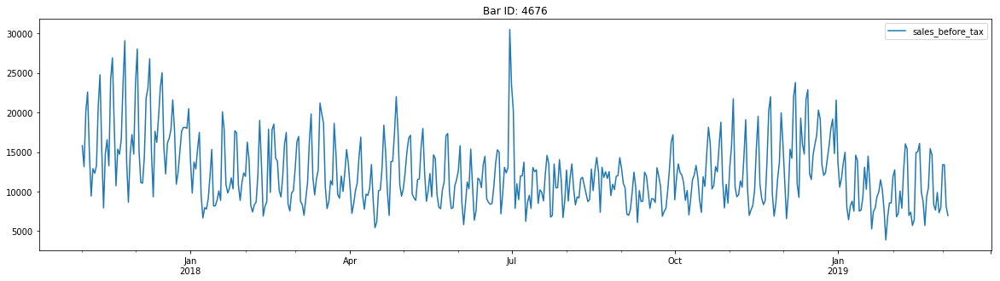

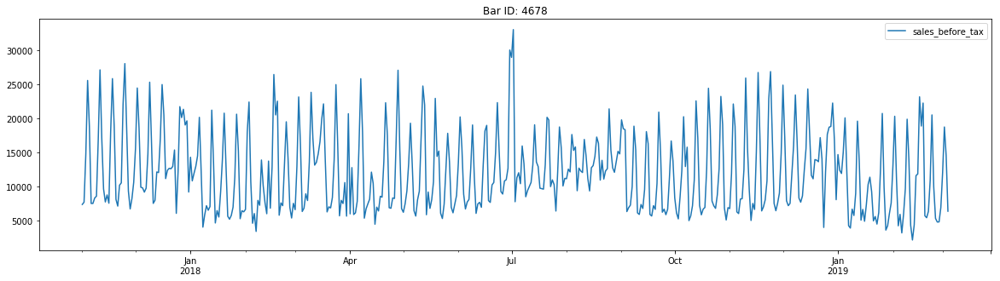

...

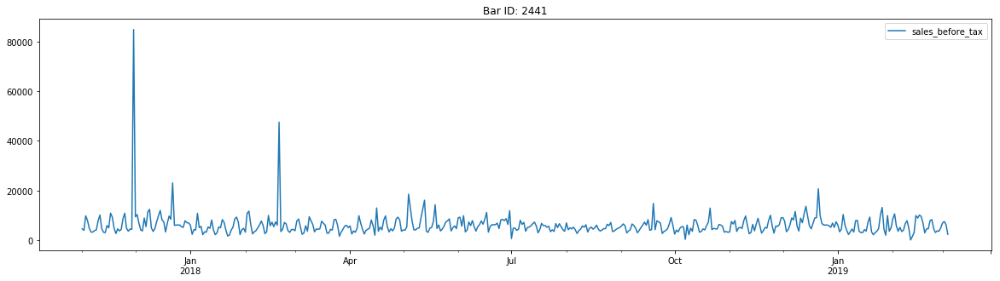

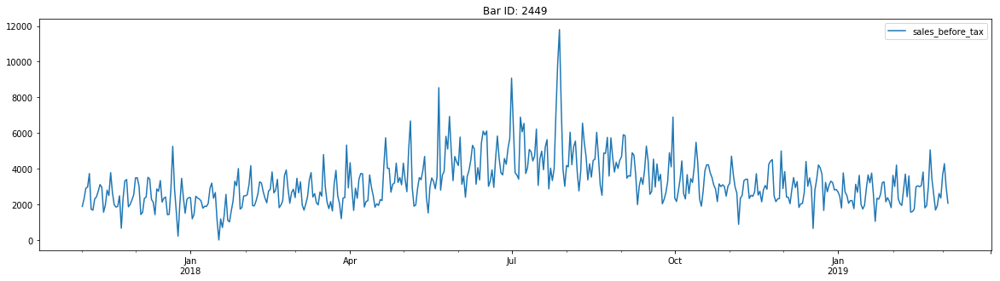

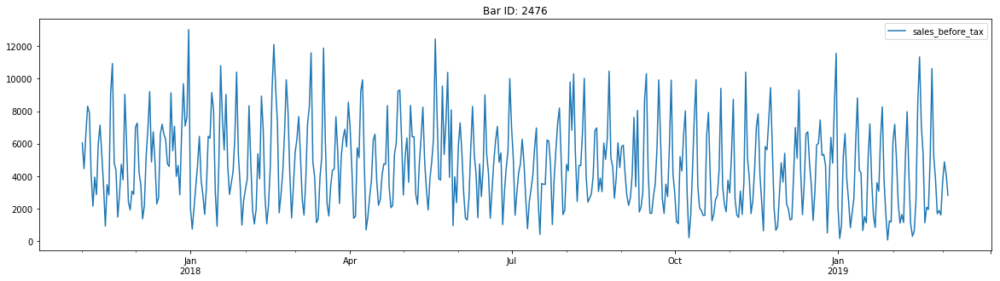

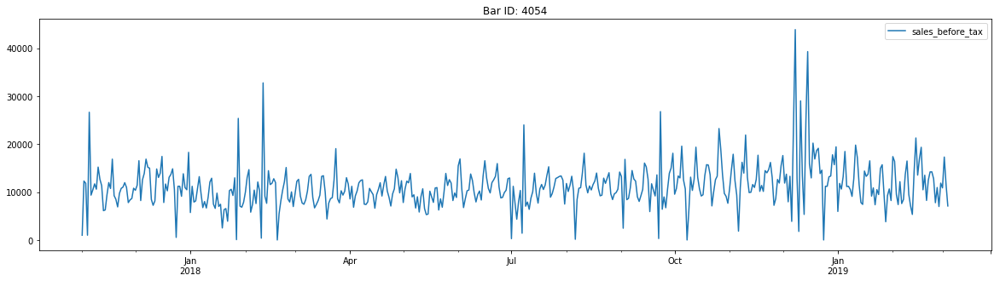

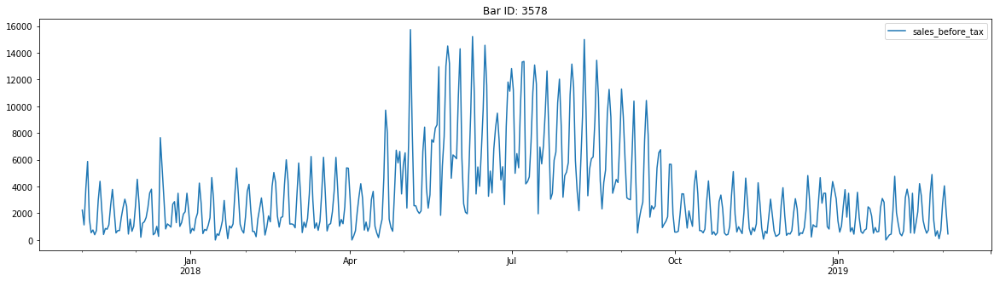

In [53]:
for key in new_bar_dict2.keys():
    from pylab import rcParams
    a = new_bar_dict2[key][0]
    rcParams['figure.figsize'] = 20, 5
    a.plot(y='sales_before_tax', use_index=True, title= 'Bar ID: '+key)

### Prepare for training!

In [55]:
time_series = []
barnames = []
for key in new_bar_dict2.keys():
    barnames.append(int(new_bar_dict2[key][0]['bar_id'].unique()))
    a = new_bar_dict2[key][0]['sales_before_tax']
    index = a.index
    time_series.append(pd.Series(data=a.values, index=index))

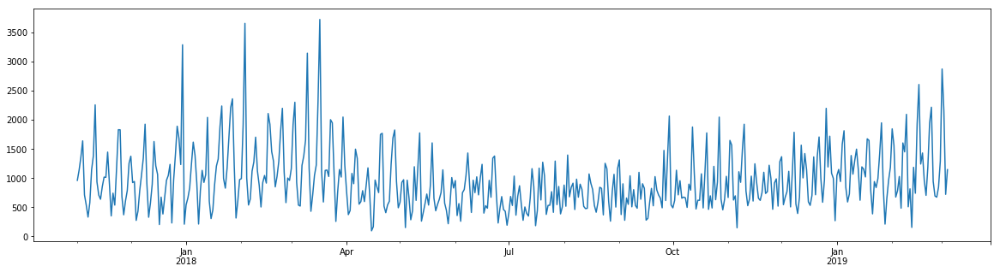

In [56]:
time_series[0].plot()
plt.show()

In [114]:
##### NEW #####
prediction_length = 300
context_length = 100
time_series_training = []
for ts in time_series:
    time_series_training.append(ts)

In [95]:
# prediction_length = 70
# context_length = 72
# time_series_training = []
# for ts in time_series:
#     time_series_training.append(ts[:-prediction_length])

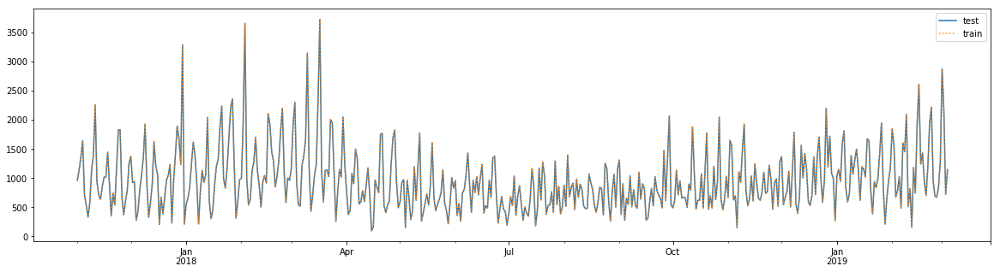

In [115]:
time_series[0].plot(label='test')
time_series_training[0].plot(label='train', ls=':')
plt.legend()
plt.show()

In [116]:
bucket = 'deepar-weis'
prefix = 'sagemaker/DEMO-deepar'

sagemaker_session = sagemaker.Session()
role = get_execution_role()

s3_data_path = "{}/{}/data".format(bucket, prefix)
s3_output_path = "{}/{}/output".format(bucket, prefix)

In [117]:
encoding = "utf-8"
s3filesystem = s3fs.S3FileSystem()

with s3filesystem.open(s3_data_path + "/train/train.json", 'wb') as fp:
    for ts in time_series_training:
        fp.write(series_to_jsonline(ts).encode(encoding))
        fp.write('\n'.encode(encoding))

with s3filesystem.open(s3_data_path + "/test/test.json", 'wb') as fp:
    for ts in time_series:
        fp.write(series_to_jsonline(ts).encode(encoding))
        fp.write('\n'.encode(encoding))

# Train

In [118]:
from sagemaker.amazon.amazon_estimator import get_image_uri
image_name = get_image_uri(boto3.Session().region_name, 'forecasting-deepar')

In [119]:
freq = 'D'

In [120]:
estimator = sagemaker.estimator.Estimator(
    sagemaker_session=sagemaker_session,
    image_name=image_name,
    role=role,
    train_instance_count=1,
    train_instance_type='ml.c4.xlarge',
    base_job_name='DEMO-deepar',
    output_path="s3://" + s3_output_path
)

In [121]:
##GOOD!
# hyperparameters = {
#     "time_freq": freq,
#     "epochs": "400",
#     "early_stopping_patience": "40",
#     "mini_batch_size": "16",
#     "learning_rate": "5E-4",
#     "context_length": str(context_length),
#     "prediction_length": str(prediction_length)
# }

hyperparameters = {
    "time_freq": freq,
    "epochs": "400",
    "early_stopping_patience": "40",
    "mini_batch_size": "16",
    "learning_rate": "1E-3",
    "context_length": str(context_length),
    "prediction_length": str(prediction_length)
}

In [122]:
estimator.set_hyperparameters(**hyperparameters)

In [123]:
data_channels = {
    "train": "s3://{}/train/".format(s3_data_path),
    "test": "s3://{}/test/".format(s3_data_path)
}

estimator.fit(inputs=data_channels)

INFO:sagemaker:Creating training-job with name: DEMO-deepar-2019-04-24-18-42-39-685


2019-04-24 18:42:39 Starting - Starting the training job...
2019-04-24 18:42:40 Starting - Launching requested ML instances......
2019-04-24 18:43:49 Starting - Preparing the instances for training.........
2019-04-24 18:45:38 Downloading - Downloading input data
2019-04-24 18:45:38 Training - Downloading the training image.
Arguments: train
[04/24/2019 18:45:44 INFO 140418589419328] Reading default configuration from /opt/amazon/lib/python2.7/site-packages/algorithm/resources/default-input.json: {u'num_dynamic_feat': u'auto', u'dropout_rate': u'0.10', u'mini_batch_size': u'128', u'test_quantiles': u'[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]', u'_tuning_objective_metric': u'', u'_num_gpus': u'auto', u'num_eval_samples': u'100', u'learning_rate': u'0.001', u'num_cells': u'40', u'num_layers': u'2', u'embedding_dimension': u'10', u'_kvstore': u'auto', u'_num_kv_servers': u'auto', u'cardinality': u'auto', u'likelihood': u'student-t', u'early_stopping_patience': u''}
[04/24/2019 18:45:4


2019-04-24 18:45:42 Training - Training image download completed. Training in progress.[04/24/2019 18:45:58 INFO 140418589419328] processed a total of 158 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2324.212074279785, "sum": 2324.212074279785, "min": 2324.212074279785}}, "EndTime": 1556131558.947963, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131556.623272}

[04/24/2019 18:45:58 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=67.9766034123 records/second
[04/24/2019 18:45:58 INFO 140418589419328] #progress_metric: host=algo-1, completed 1 % of epochs
[04/24/2019 18:45:58 INFO 140418589419328] #quality_metric: host=algo-1, epoch=4, train loss <loss>=8.54041147232
[04/24/2019 18:45:58 INFO 140418589419328] loss did not improve
[04/24/2019 18:45:59 INFO 140418589419328] Epoch[5] Batch[0] avg_epoch_loss=8.454799
[04/24/2019 18:45:59 INFO 140418589419328] #quality_metric: host=algo-1, 

[04/24/2019 18:46:18 INFO 140418589419328] Epoch[13] Batch[5] avg_epoch_loss=8.475763
[04/24/2019 18:46:18 INFO 140418589419328] #quality_metric: host=algo-1, epoch=13, batch=5 train loss <loss>=8.47576268514
[04/24/2019 18:46:18 INFO 140418589419328] Epoch[13] Batch [5]#011Speed: 66.22 samples/sec#011loss=8.475763
[04/24/2019 18:46:19 INFO 140418589419328] processed a total of 142 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2140.141010284424, "sum": 2140.141010284424, "min": 2140.141010284424}}, "EndTime": 1556131579.543047, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131577.402499}

[04/24/2019 18:46:19 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=66.3472942468 records/second
[04/24/2019 18:46:19 INFO 140418589419328] #progress_metric: host=algo-1, completed 3 % of epochs
[04/24/2019 18:46:19 INFO 140418589419328] #quality_metric: host=algo-1, epoch=13, train loss <loss>=8.3894

[04/24/2019 18:46:38 INFO 140418589419328] Epoch[23] Batch[0] avg_epoch_loss=8.471570
[04/24/2019 18:46:38 INFO 140418589419328] #quality_metric: host=algo-1, epoch=23, batch=0 train loss <loss>=8.47157001495
[04/24/2019 18:46:39 INFO 140418589419328] Epoch[23] Batch[5] avg_epoch_loss=8.337150
[04/24/2019 18:46:39 INFO 140418589419328] #quality_metric: host=algo-1, epoch=23, batch=5 train loss <loss>=8.33714993795
[04/24/2019 18:46:39 INFO 140418589419328] Epoch[23] Batch [5]#011Speed: 69.24 samples/sec#011loss=8.337150
[04/24/2019 18:46:40 INFO 140418589419328] processed a total of 144 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2098.341941833496, "sum": 2098.341941833496, "min": 2098.341941833496}}, "EndTime": 1556131600.09929, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131598.000452}

[04/24/2019 18:46:40 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=68.6217213426 records/seco

[04/24/2019 18:46:59 INFO 140418589419328] Epoch[32] Batch[10] avg_epoch_loss=8.121652
[04/24/2019 18:46:59 INFO 140418589419328] #quality_metric: host=algo-1, epoch=32, batch=10 train loss <loss>=7.90230131149
[04/24/2019 18:46:59 INFO 140418589419328] Epoch[32] Batch [10]#011Speed: 72.48 samples/sec#011loss=7.902301
[04/24/2019 18:46:59 INFO 140418589419328] processed a total of 169 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2500.544786453247, "sum": 2500.544786453247, "min": 2500.544786453247}}, "EndTime": 1556131619.236885, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131616.735932}

[04/24/2019 18:46:59 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=67.5824047122 records/second
[04/24/2019 18:46:59 INFO 140418589419328] #progress_metric: host=algo-1, completed 8 % of epochs
[04/24/2019 18:46:59 INFO 140418589419328] #quality_metric: host=algo-1, epoch=32, train loss <loss>=8.1

[04/24/2019 18:47:19 INFO 140418589419328] Epoch[42] Batch[5] avg_epoch_loss=8.375966
[04/24/2019 18:47:19 INFO 140418589419328] #quality_metric: host=algo-1, epoch=42, batch=5 train loss <loss>=8.37596607208
[04/24/2019 18:47:19 INFO 140418589419328] Epoch[42] Batch [5]#011Speed: 70.41 samples/sec#011loss=8.375966
[04/24/2019 18:47:20 INFO 140418589419328] processed a total of 149 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2270.26104927063, "sum": 2270.26104927063, "min": 2270.26104927063}}, "EndTime": 1556131640.259615, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131637.988859}

[04/24/2019 18:47:20 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=65.6279796506 records/second
[04/24/2019 18:47:20 INFO 140418589419328] #progress_metric: host=algo-1, completed 10 % of epochs
[04/24/2019 18:47:20 INFO 140418589419328] #quality_metric: host=algo-1, epoch=42, train loss <loss>=8.407175

[04/24/2019 18:47:40 INFO 140418589419328] Epoch[52] Batch[5] avg_epoch_loss=8.356936
[04/24/2019 18:47:40 INFO 140418589419328] #quality_metric: host=algo-1, epoch=52, batch=5 train loss <loss>=8.35693645477
[04/24/2019 18:47:40 INFO 140418589419328] Epoch[52] Batch [5]#011Speed: 71.48 samples/sec#011loss=8.356936
[04/24/2019 18:47:41 INFO 140418589419328] processed a total of 130 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2056.974172592163, "sum": 2056.974172592163, "min": 2056.974172592163}}, "EndTime": 1556131661.059354, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131659.001926}

[04/24/2019 18:47:41 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=63.1960961779 records/second
[04/24/2019 18:47:41 INFO 140418589419328] #progress_metric: host=algo-1, completed 13 % of epochs
[04/24/2019 18:47:41 INFO 140418589419328] #quality_metric: host=algo-1, epoch=52, train loss <loss>=8.354

[04/24/2019 18:48:00 INFO 140418589419328] processed a total of 154 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2299.778938293457, "sum": 2299.778938293457, "min": 2299.778938293457}}, "EndTime": 1556131680.552979, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131678.252757}

[04/24/2019 18:48:00 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=66.9602505069 records/second
[04/24/2019 18:48:00 INFO 140418589419328] #progress_metric: host=algo-1, completed 15 % of epochs
[04/24/2019 18:48:00 INFO 140418589419328] #quality_metric: host=algo-1, epoch=61, train loss <loss>=8.30379824638
[04/24/2019 18:48:00 INFO 140418589419328] loss did not improve
[04/24/2019 18:48:00 INFO 140418589419328] Epoch[62] Batch[0] avg_epoch_loss=8.336291
[04/24/2019 18:48:00 INFO 140418589419328] #quality_metric: host=algo-1, epoch=62, batch=0 train loss <loss>=8.33629131317
[04/24/2019 18:48:01 INFO 140418589

[04/24/2019 18:48:20 INFO 140418589419328] Epoch[71] Batch[0] avg_epoch_loss=8.224097
[04/24/2019 18:48:20 INFO 140418589419328] #quality_metric: host=algo-1, epoch=71, batch=0 train loss <loss>=8.22409725189
[04/24/2019 18:48:21 INFO 140418589419328] Epoch[71] Batch[5] avg_epoch_loss=8.221084
[04/24/2019 18:48:21 INFO 140418589419328] #quality_metric: host=algo-1, epoch=71, batch=5 train loss <loss>=8.22108395894
[04/24/2019 18:48:21 INFO 140418589419328] Epoch[71] Batch [5]#011Speed: 73.81 samples/sec#011loss=8.221084
[04/24/2019 18:48:22 INFO 140418589419328] processed a total of 154 examples
#metrics {"Metrics": {"update.time": {"count": 1, "max": 2236.8218898773193, "sum": 2236.8218898773193, "min": 2236.8218898773193}}, "EndTime": 1556131702.352615, "Dimensions": {"Host": "algo-1", "Operation": "training", "Algorithm": "AWS/DeepAR"}, "StartTime": 1556131700.115293}

[04/24/2019 18:48:22 INFO 140418589419328] #throughput_metric: host=algo-1, train throughput=68.8442982222 records/

In [124]:
job_name = estimator.latest_training_job.name

endpoint_name = sagemaker_session.endpoint_from_job(
    job_name=job_name,
    initial_instance_count=1,
    instance_type='ml.m4.xlarge',
    deployment_image=image_name,
    role=role
)

INFO:sagemaker:Creating model with name: DEMO-deepar-2019-04-24-18-42-39-685
INFO:sagemaker:Creating endpoint-config with name DEMO-deepar-2019-04-24-18-42-39-685
INFO:sagemaker:Creating endpoint with name DEMO-deepar-2019-04-24-18-42-39-685


-----------------------------------------------------------------------------------------!

In [106]:
class DeepARPredictor(sagemaker.predictor.RealTimePredictor):

    def set_prediction_parameters(self, freq, prediction_length):
        """Set the time frequency and prediction length parameters. This method **must** be called
        before being able to use `predict`.
        
        Parameters:
        freq -- string indicating the time frequency
        prediction_length -- integer, number of predicted time points
        
        Return value: none.
        """
        self.freq = freq
        self.prediction_length = prediction_length
        
    def predict(self, ts, cat=None, encoding="utf-8", num_samples=100, quantiles=["0.1", "0.5", "0.9"]):
        """Requests the prediction of for the time series listed in `ts`, each with the (optional)
        corresponding category listed in `cat`.
        
        Parameters:
        ts -- list of `pandas.Series` objects, the time series to predict
        cat -- list of integers (default: None)
        encoding -- string, encoding to use for the request (default: "utf-8")
        num_samples -- integer, number of samples to compute at prediction time (default: 100)
        quantiles -- list of strings specifying the quantiles to compute (default: ["0.1", "0.5", "0.9"])
        
        Return value: list of `pandas.DataFrame` objects, each containing the predictions
        """
        prediction_times = [x.index[-1]+1 for x in ts]
        req = self.__encode_request(ts, cat, encoding, num_samples, quantiles)
        res = super(DeepARPredictor, self).predict(req)
        return self.__decode_response(res, prediction_times, encoding)
    
    def __encode_request(self, ts, cat, encoding, num_samples, quantiles):
        instances = [series_to_obj(ts[k], cat[k] if cat else None) for k in range(len(ts))]
        configuration = {"num_samples": num_samples, "output_types": ["quantiles"], "quantiles": quantiles}
        http_request_data = {"instances": instances, "configuration": configuration}
        return json.dumps(http_request_data).encode(encoding)
    
    def __decode_response(self, response, prediction_times, encoding):
        response_data = json.loads(response.decode(encoding))
        list_of_df = []
        for k in range(len(prediction_times)):
            prediction_index = pd.DatetimeIndex(start=prediction_times[k], freq=self.freq, periods=self.prediction_length)
            list_of_df.append(pd.DataFrame(data=response_data['predictions'][k]['quantiles'], index=prediction_index))
        return list_of_df

In [125]:
predictor = DeepARPredictor(
    endpoint=endpoint_name,
    sagemaker_session=sagemaker_session,
    content_type="application/json"
)
# predictor.set_prediction_parameters(freq, prediction_length)
predictor.set_prediction_parameters(freq, 300)

In [127]:
list_of_df = predictor.predict(time_series_training)
actual_data = time_series

RMS Error:  785.8969662982735
Corr. Coef. =  -11.862343717012164


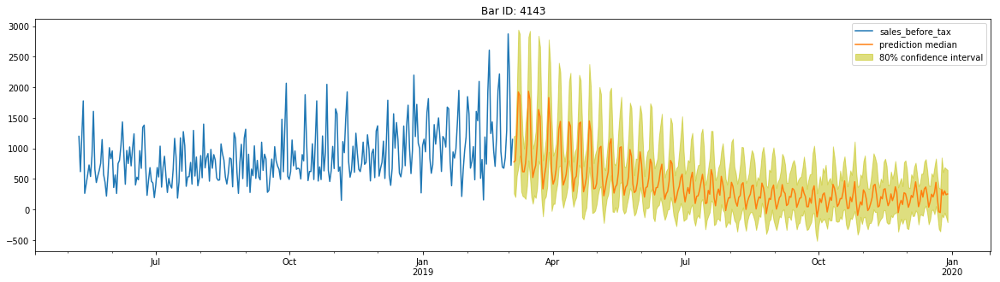

RMS Error:  883.6586832557127
Corr. Coef. =  16.205133734997304


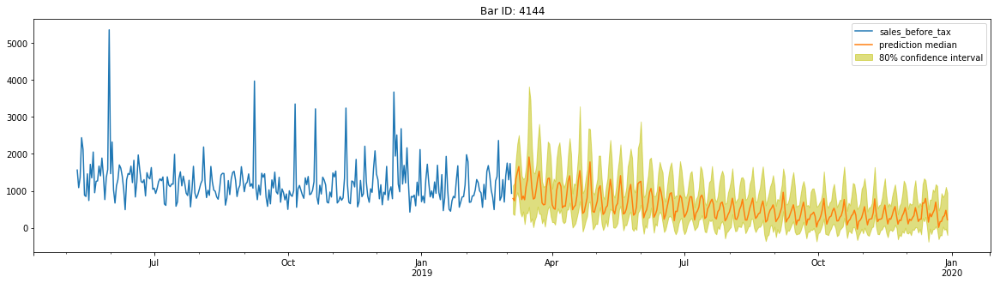

RMS Error:  3621.4224229101414
Corr. Coef. =  -10.06481597334648


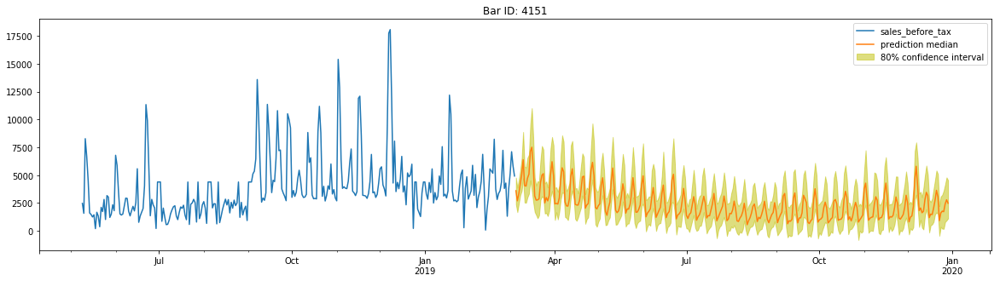

RMS Error:  7096.75398392943
Corr. Coef. =  20.303836376202042


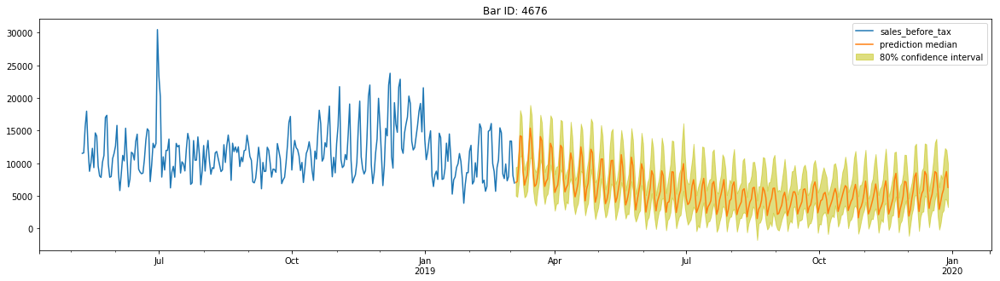

RMS Error:  7261.23538901196
Corr. Coef. =  47.44570669151615


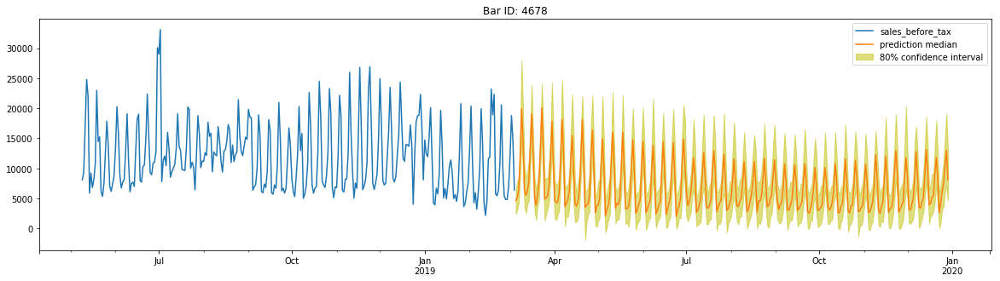

RMS Error:  5949.983886815875
Corr. Coef. =  39.4682140488679


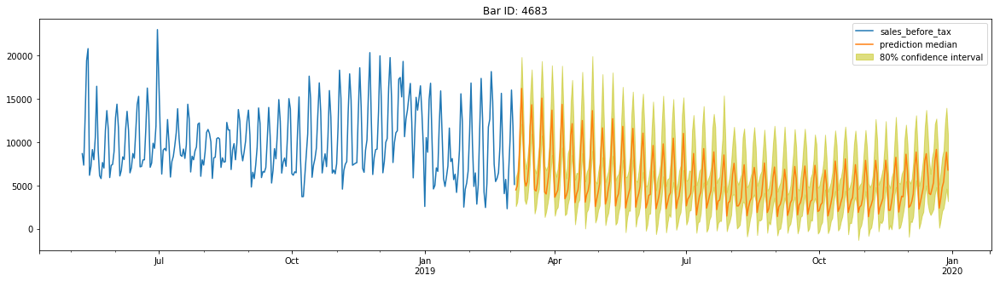

RMS Error:  3027.731247286657
Corr. Coef. =  23.68505074056258


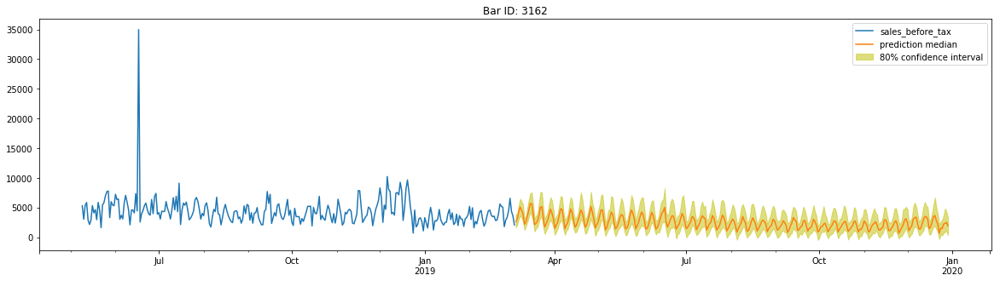

RMS Error:  8668.13164242753
Corr. Coef. =  57.70467097577458


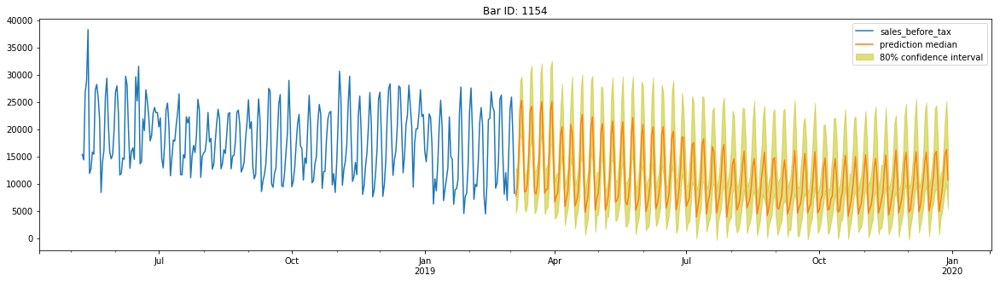

RMS Error:  6533.591834040598
Corr. Coef. =  49.97386520067421


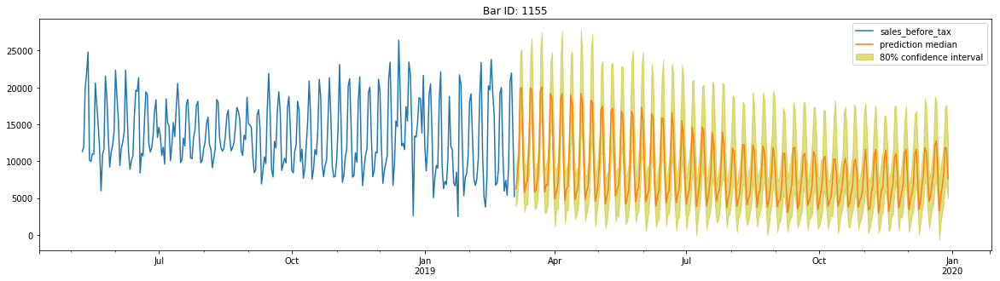

RMS Error:  5242.864801317662
Corr. Coef. =  28.70471325241323


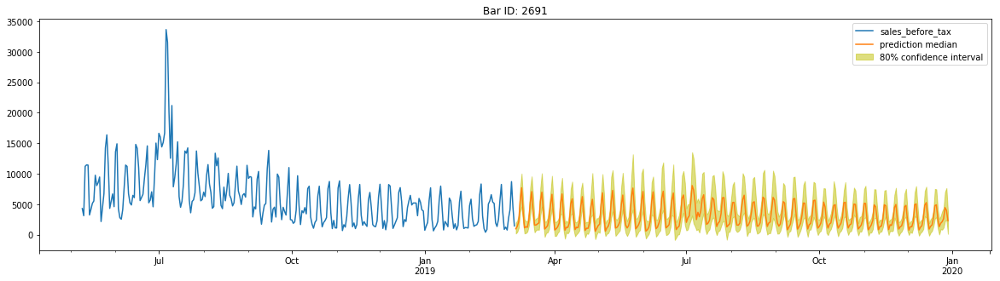

RMS Error:  6677.111849763809
Corr. Coef. =  60.120478787843766


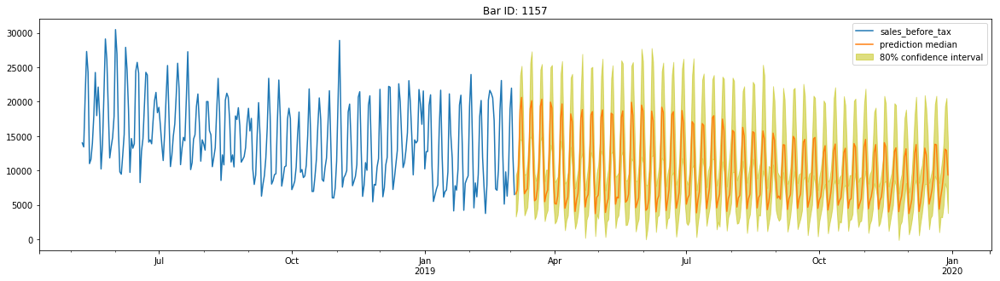

RMS Error:  8882.351301397137
Corr. Coef. =  57.13198508719072


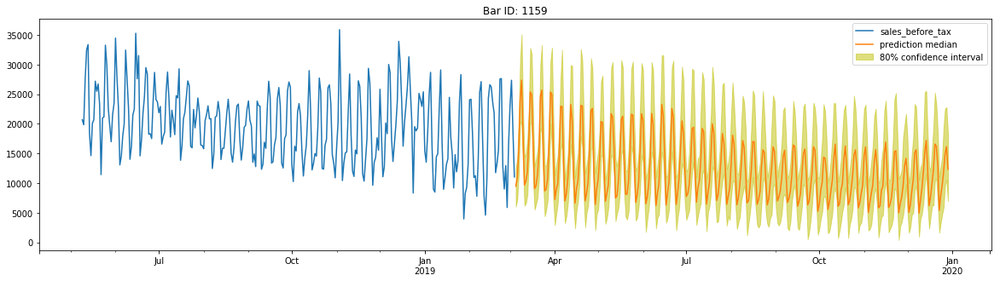

RMS Error:  1818.784367630406
Corr. Coef. =  40.07094036325896


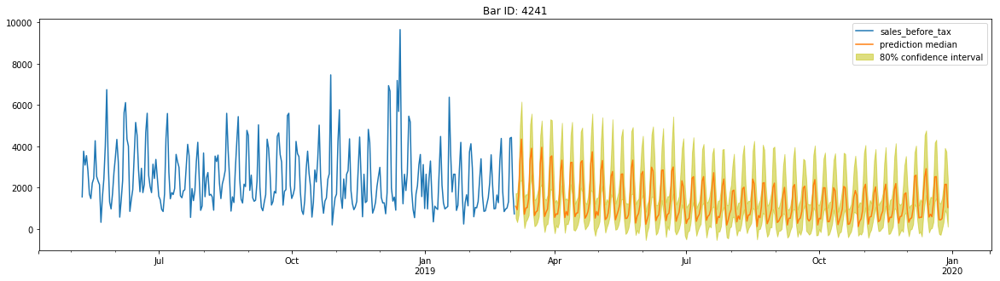

RMS Error:  7059.09151093587
Corr. Coef. =  46.08877117722848


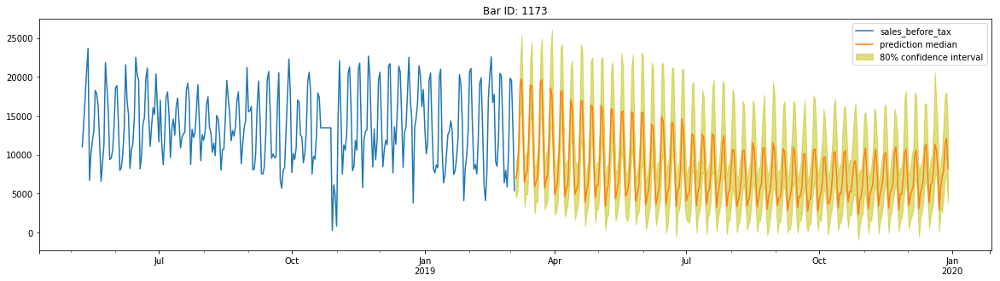

RMS Error:  14306.944820938772
Corr. Coef. =  33.966251327708854


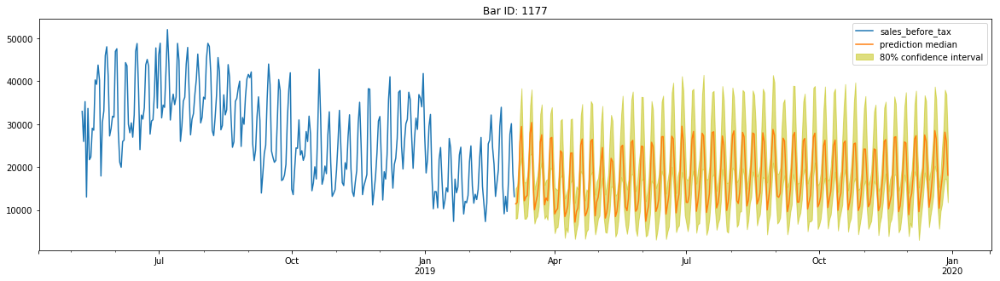

RMS Error:  6506.109191606361
Corr. Coef. =  44.75077686534124


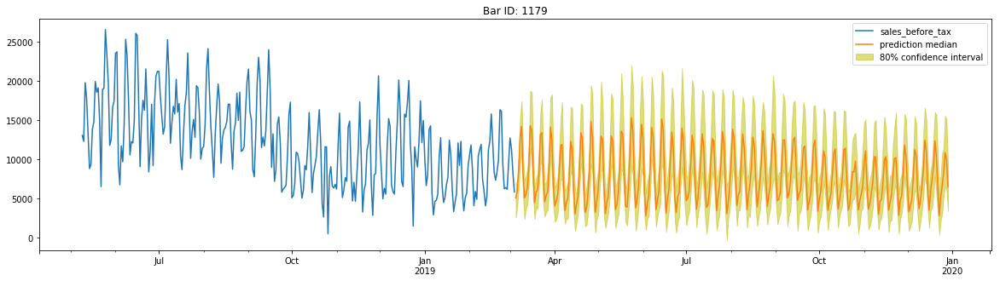

RMS Error:  12653.327247837162
Corr. Coef. =  -7.092240025191747


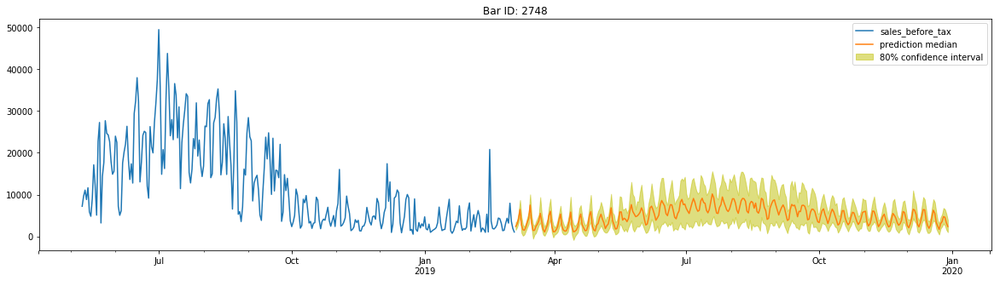

RMS Error:  5307.29719914887
Corr. Coef. =  33.7457944537727


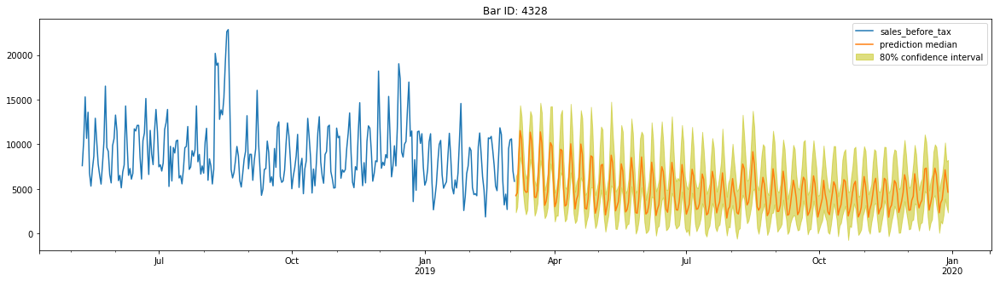

RMS Error:  1761.7787009472934
Corr. Coef. =  34.407560170632465


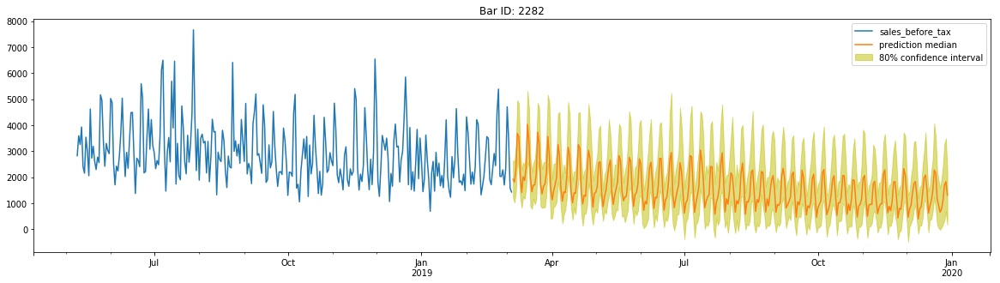

RMS Error:  10823.402427992216
Corr. Coef. =  42.597349890926104


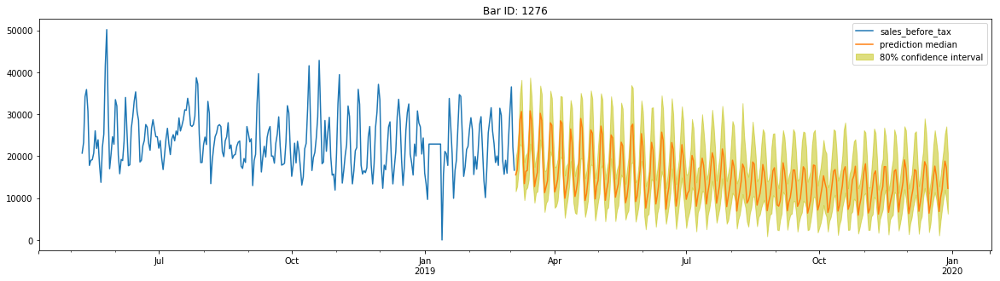

RMS Error:  8570.564819371662
Corr. Coef. =  59.95550253161086


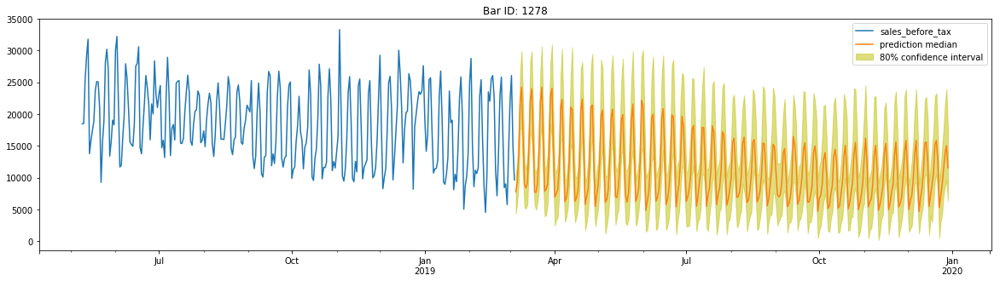

RMS Error:  18695.45038035373
Corr. Coef. =  37.772779739678406


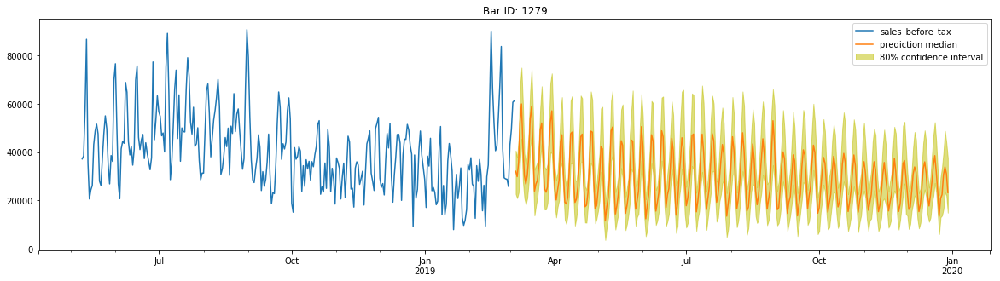

RMS Error:  1083.214200591872
Corr. Coef. =  14.352499195541524


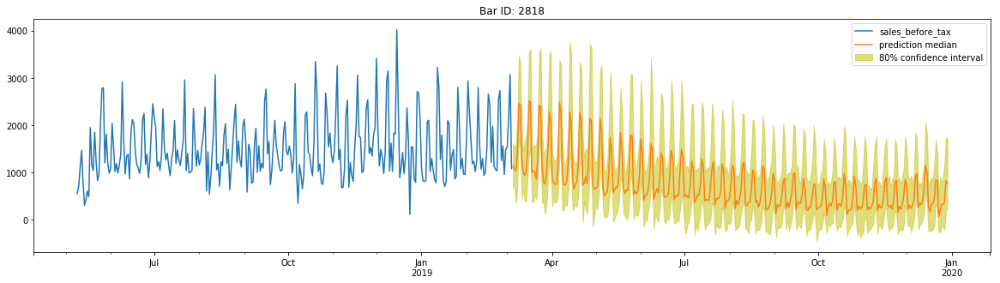

RMS Error:  4217.014290637249
Corr. Coef. =  37.8516552585166


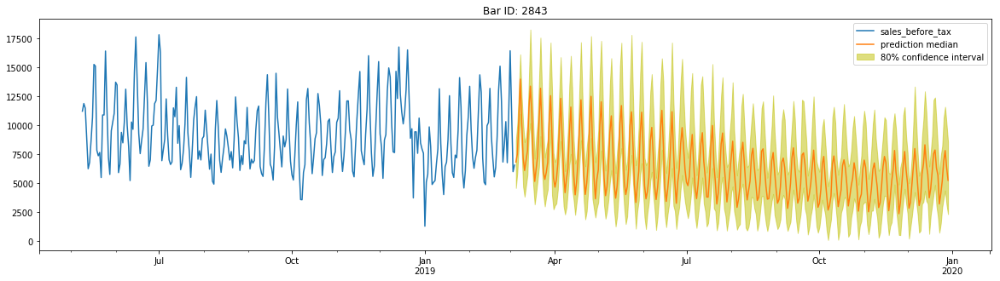

RMS Error:  1764.154510369422
Corr. Coef. =  0.8987749501922205


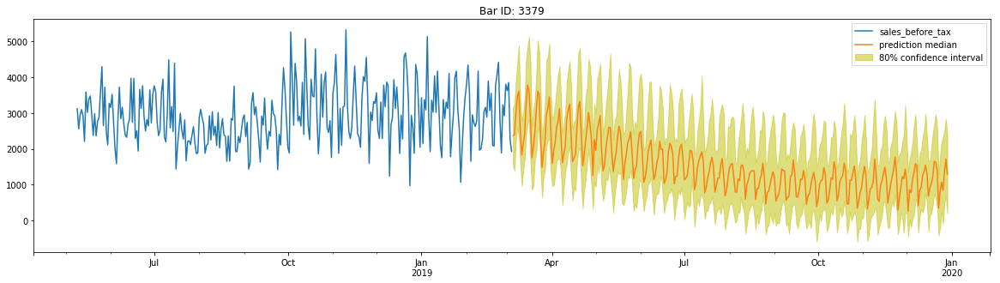

RMS Error:  8606.797829408277
Corr. Coef. =  10.318029572681153


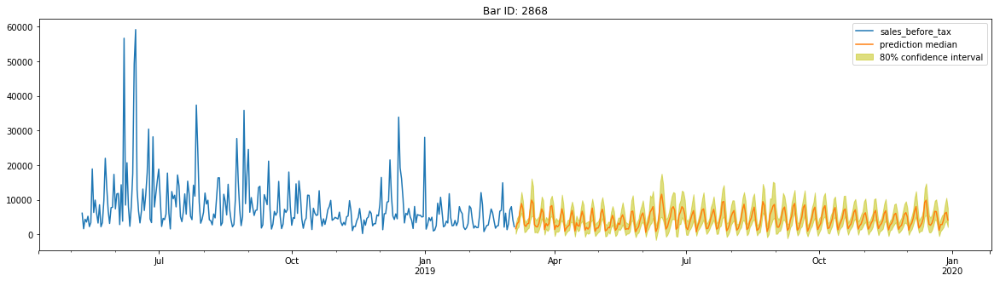

RMS Error:  2876.013968097344
Corr. Coef. =  37.40309434676378


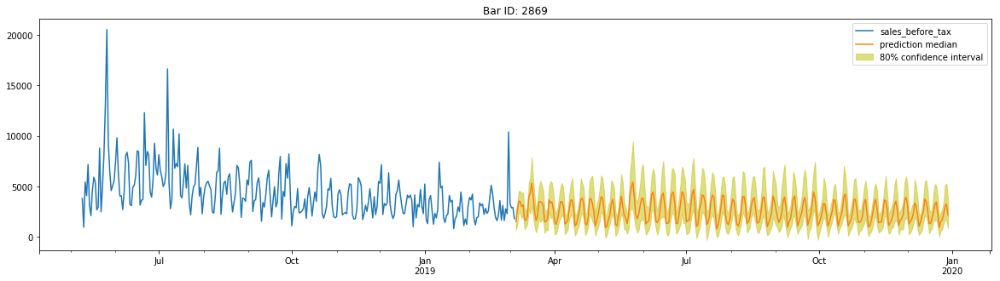

RMS Error:  6277.368196689993
Corr. Coef. =  -2.766610847848798


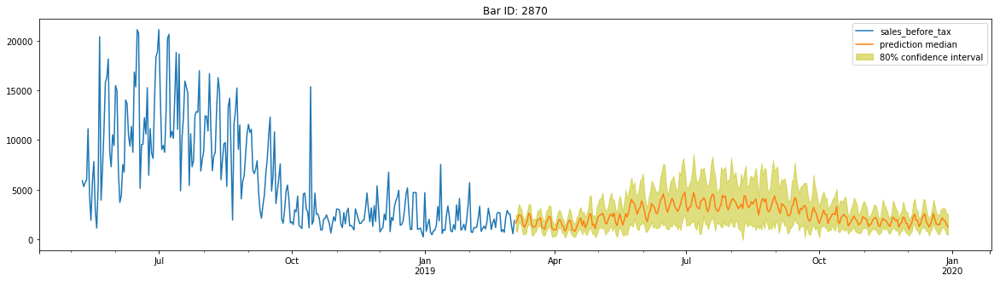

RMS Error:  3135.332320583691
Corr. Coef. =  31.724646918749023


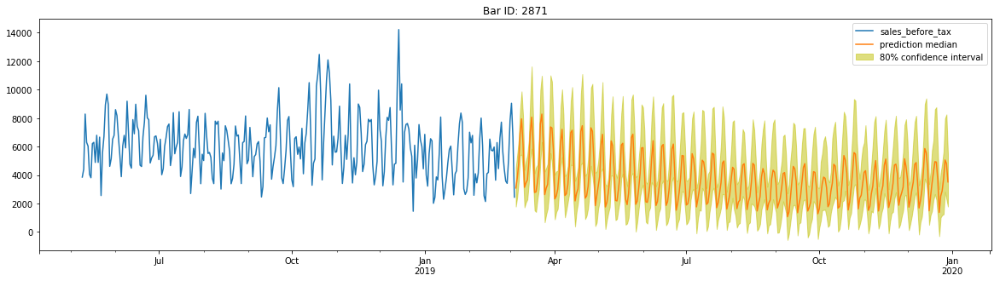

RMS Error:  1201.6414637322066
Corr. Coef. =  28.957886541667193


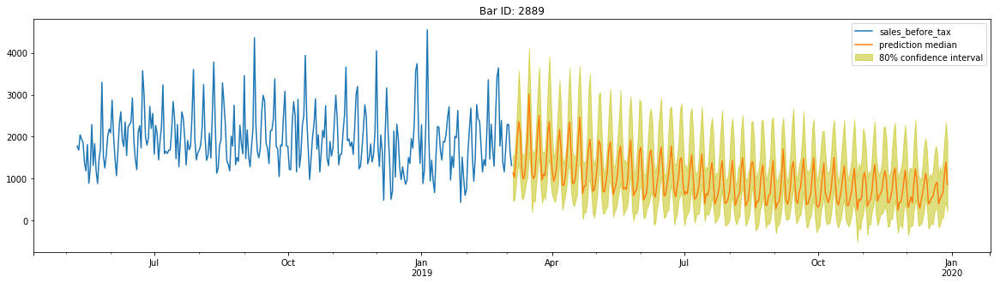

RMS Error:  2034.3102688939975
Corr. Coef. =  28.301061819675034


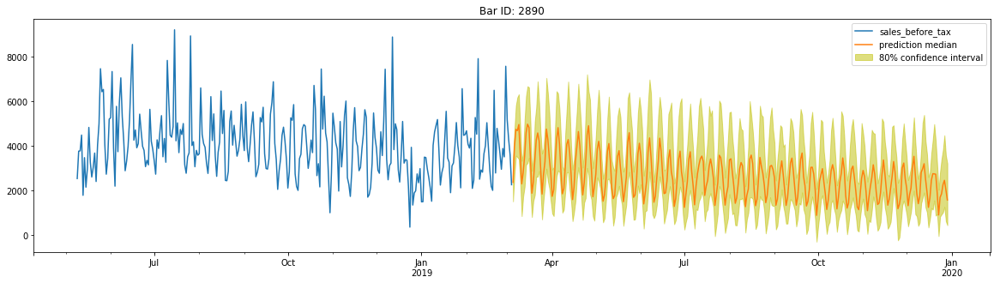

RMS Error:  3951.2361607605785
Corr. Coef. =  25.15017731847567


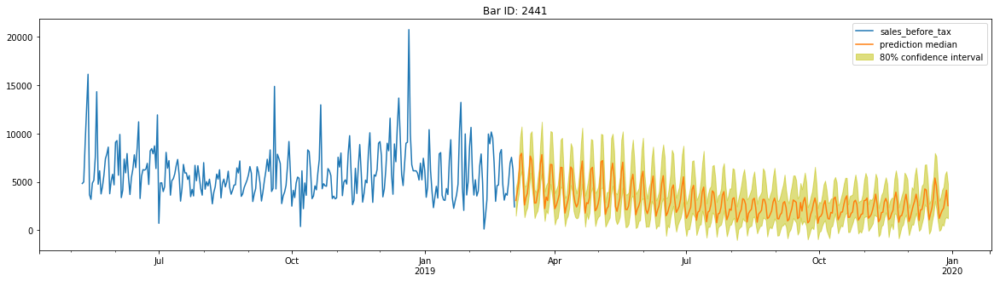

RMS Error:  2026.1255590390663
Corr. Coef. =  39.63336615005546


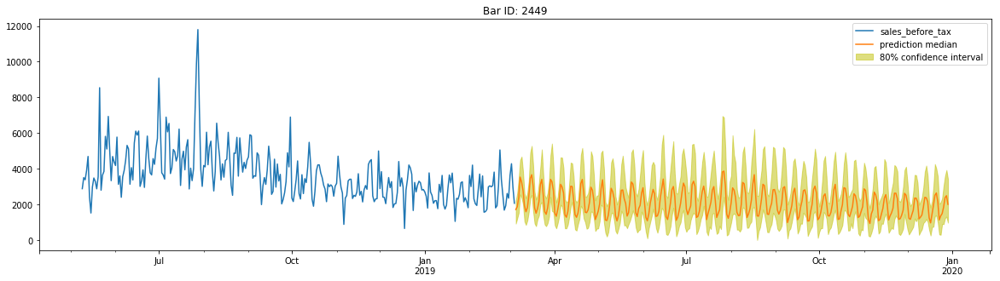

RMS Error:  3010.0949695089917
Corr. Coef. =  44.21723859809934


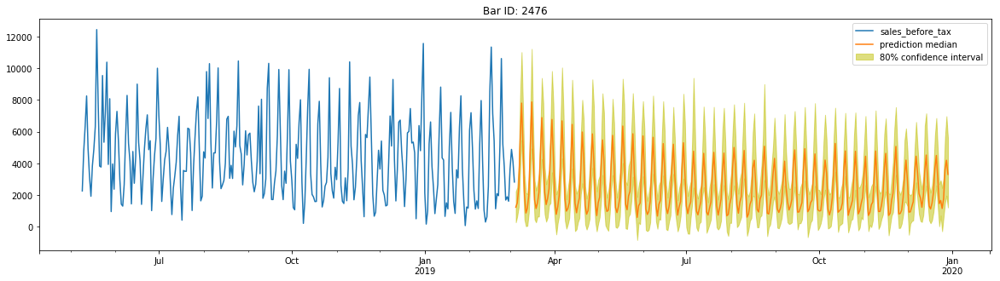

RMS Error:  8230.291267294853
Corr. Coef. =  0.10179585148574956


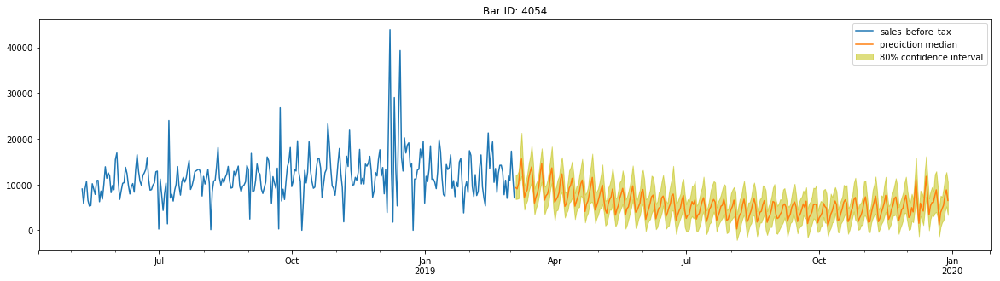

RMS Error:  4263.790351593297
Corr. Coef. =  30.575485118631025


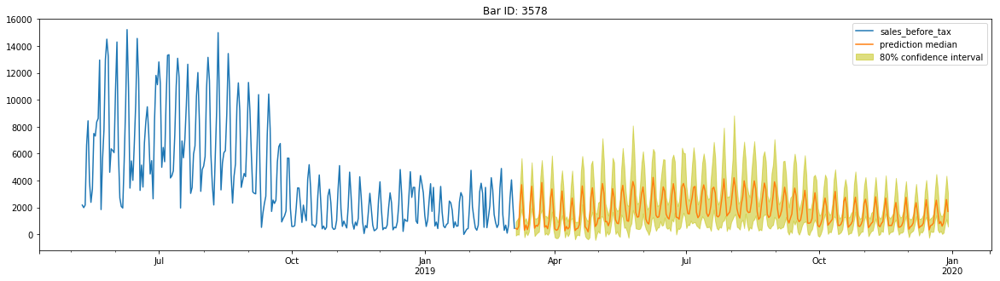

In [130]:
rmse_list = []
ccoef_list = []
for k in range(len(list_of_df)):
    plt.figure(figsize=(20,5))
    actual_data[k][-prediction_length:].plot(label='sales_before_tax')
    p10 = list_of_df[k]['0.1']
    p90 = list_of_df[k]['0.9']
    plt.fill_between(p10.index, p10, p90, color='y', alpha=0.5, label='80% confidence interval')
    list_of_df[k]['0.5'].plot(label='prediction median')
        
    rmse = sqrt(mean_squared_error(actual_data[k][-prediction_length:], list_of_df[k]['0.5']))
    ccoef = 100*np.corrcoef(actual_data[k][-prediction_length:].T,list_of_df[k]['0.5'].T)[0,1]
    rmse_list.append(rmse)
    ccoef_list.append(ccoef)
    
    print('RMS Error: ',rmse)
    print('Corr. Coef. = ',ccoef)   
    
    plt.legend()
    plt.title('Bar ID: '+str(barnames[k]))
    plt.show()

RMS Error:  638.0435282771228
Corr. Coef. =  -12.01360611238666


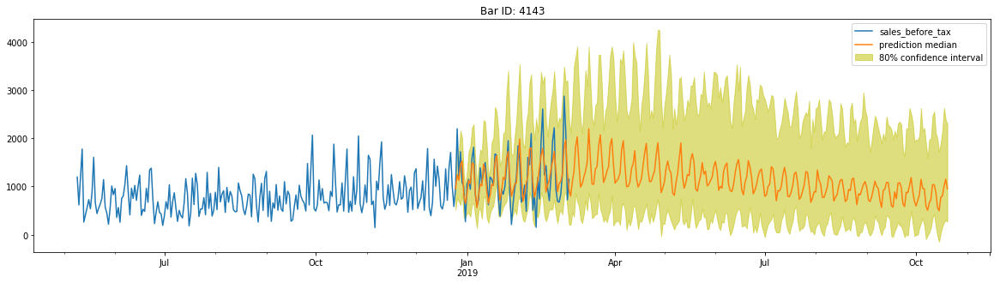

RMS Error:  836.6028603577715
Corr. Coef. =  7.596647055137165


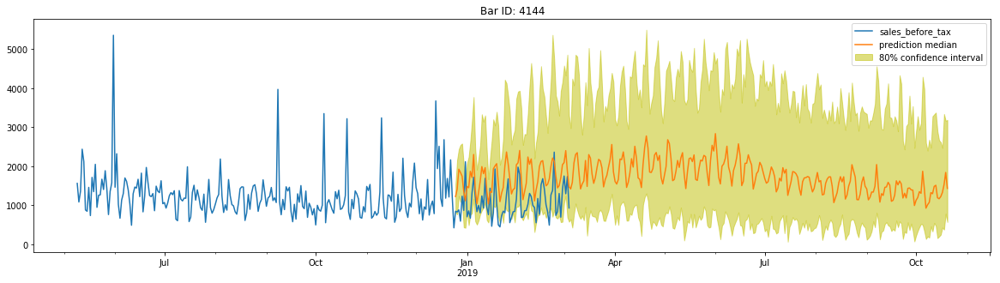

RMS Error:  3639.304241977355
Corr. Coef. =  1.924864581246585


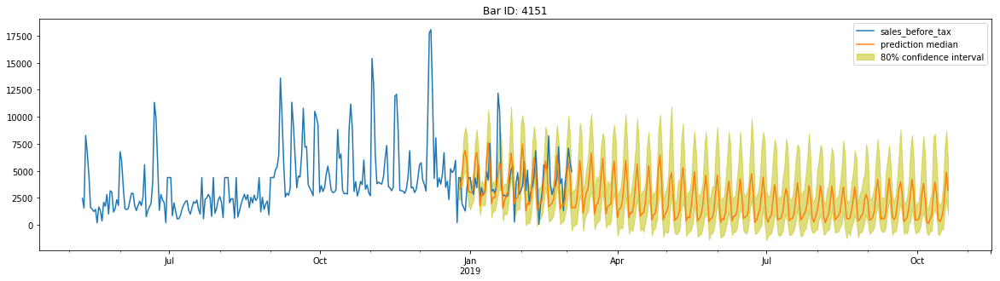

RMS Error:  4837.626183207283
Corr. Coef. =  47.69854829408193


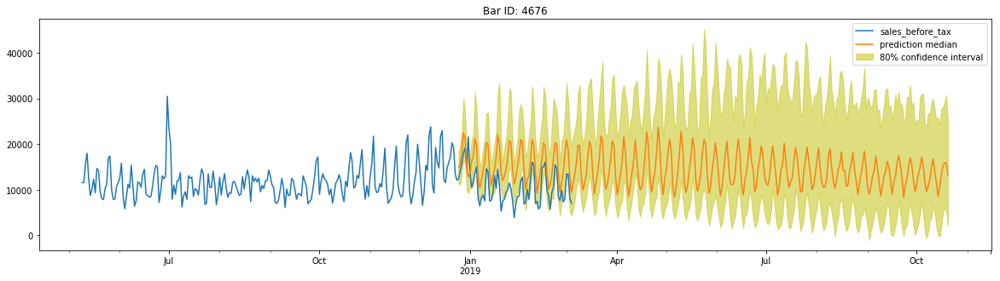

RMS Error:  6480.843793461886
Corr. Coef. =  54.174646060164875


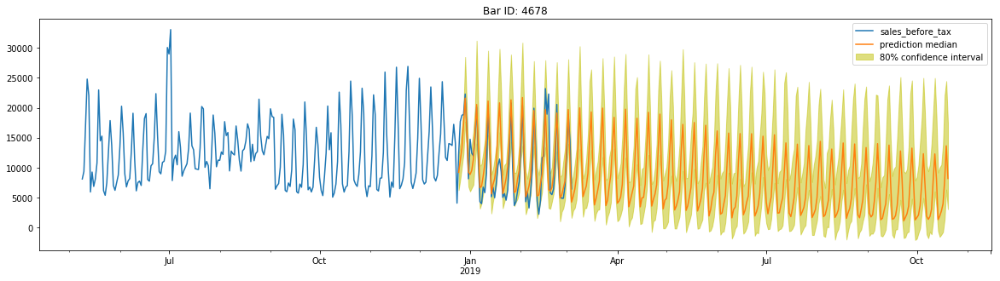

RMS Error:  3756.680396545641
Corr. Coef. =  59.27076550895137


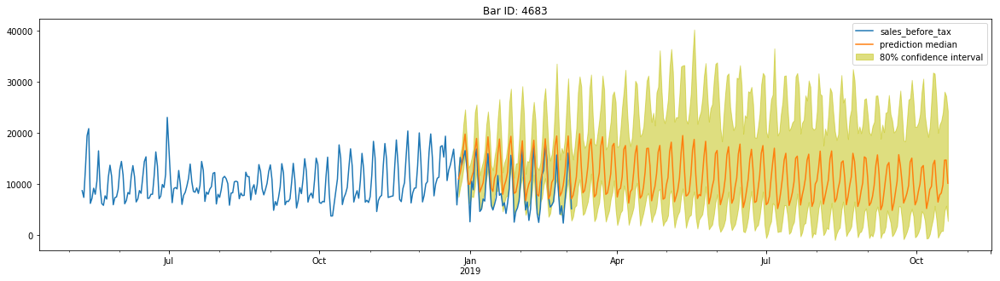

RMS Error:  2551.9398213241866
Corr. Coef. =  30.903021144494108


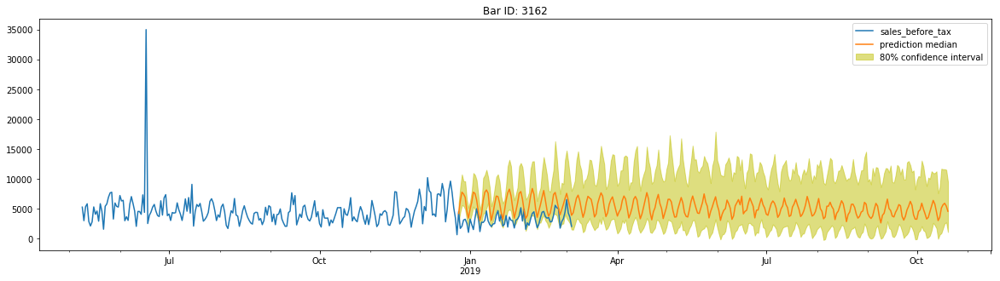

RMS Error:  7397.409153509777
Corr. Coef. =  69.00219014262068


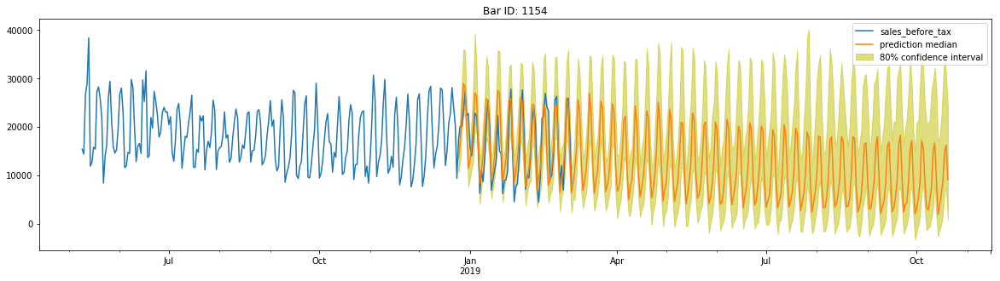

RMS Error:  6278.286567056448
Corr. Coef. =  60.48277406237851


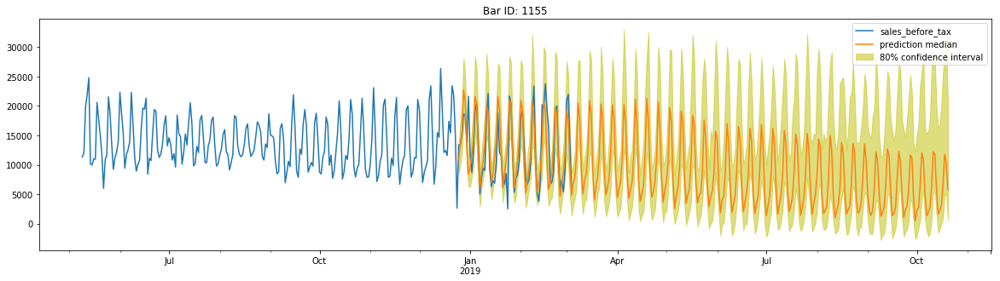

RMS Error:  5795.083345639595
Corr. Coef. =  -15.12438056132308


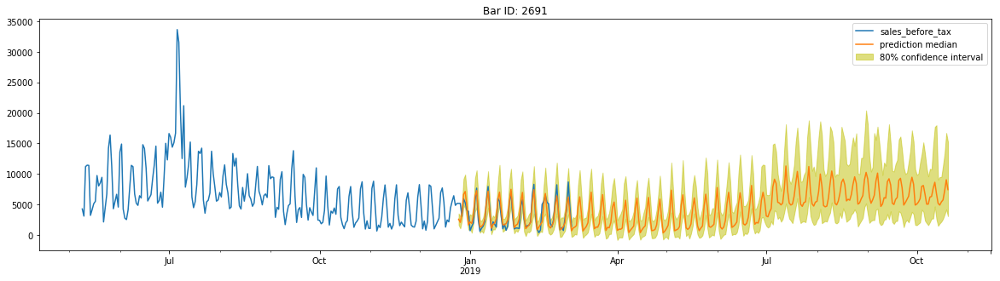

RMS Error:  6202.760726556912
Corr. Coef. =  64.8530250272171


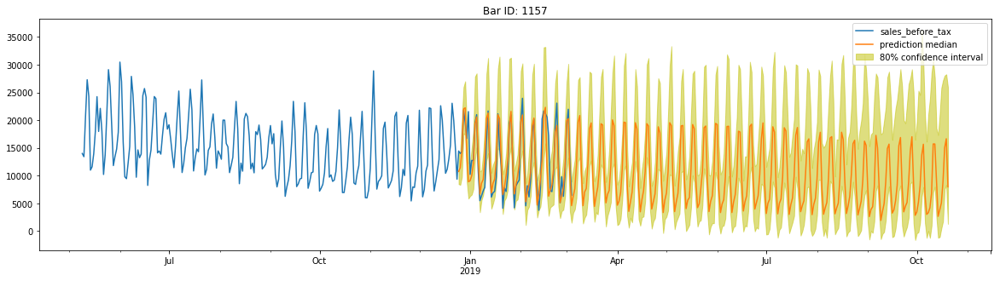

RMS Error:  7004.939684958232
Corr. Coef. =  70.64240208790197


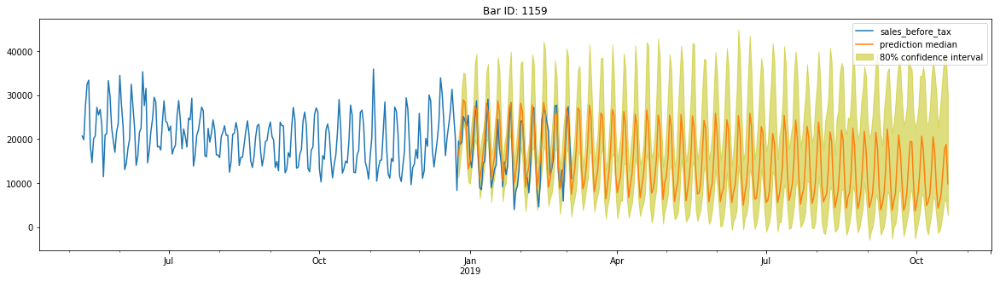

RMS Error:  1584.9729793783158
Corr. Coef. =  37.60862838137589


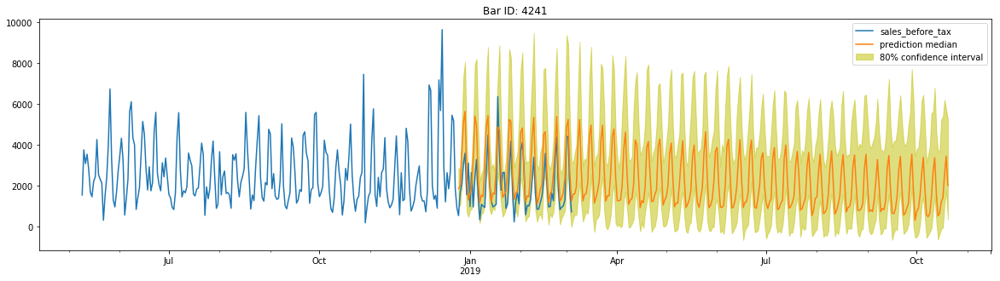

RMS Error:  5802.489953348792
Corr. Coef. =  57.61369393128688


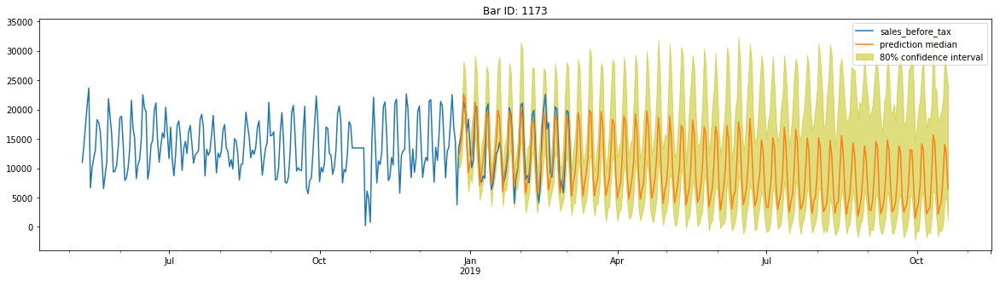

RMS Error:  12343.965805885175
Corr. Coef. =  60.43573731775438


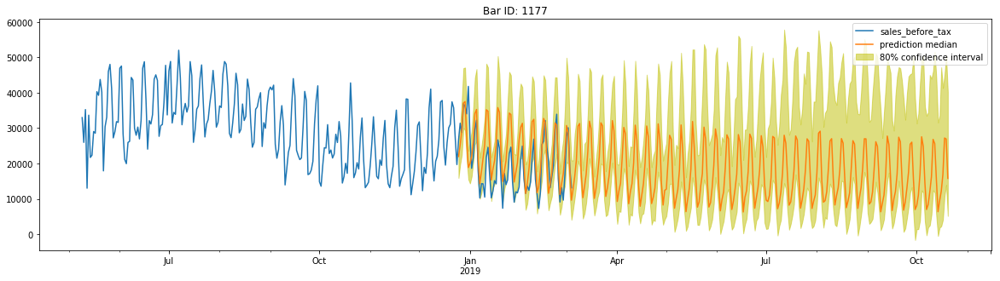

RMS Error:  5581.754603847435
Corr. Coef. =  42.79569430956775


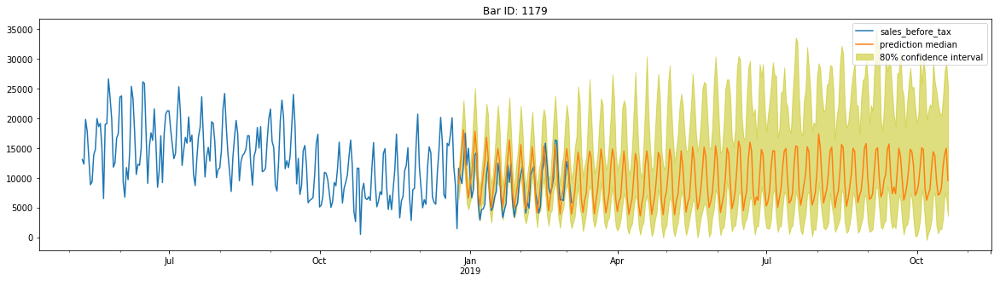

RMS Error:  17434.459092780307
Corr. Coef. =  -61.143227431793434


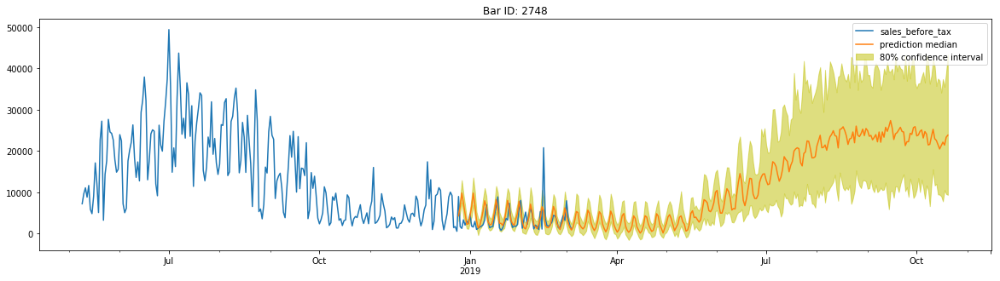

RMS Error:  4395.576328280622
Corr. Coef. =  43.97805789738964


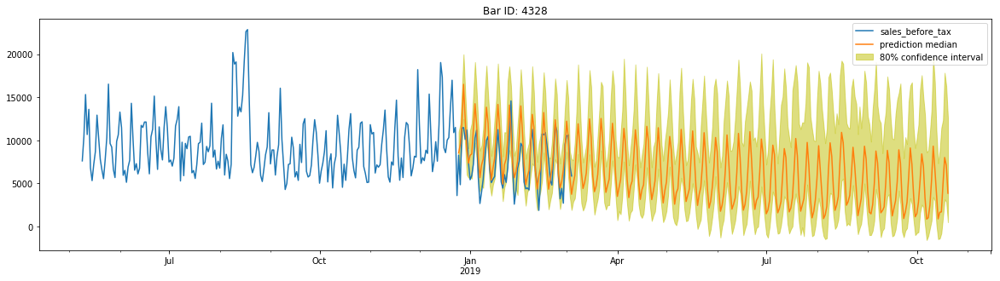

RMS Error:  1311.5307236264114
Corr. Coef. =  34.57752603240966


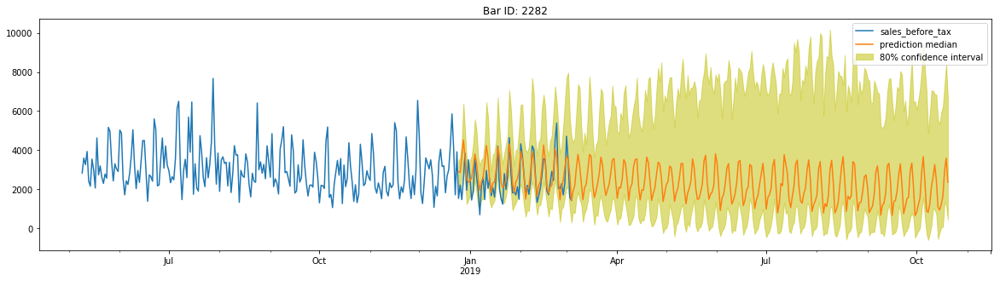

RMS Error:  12254.377596515007
Corr. Coef. =  53.21469191227899


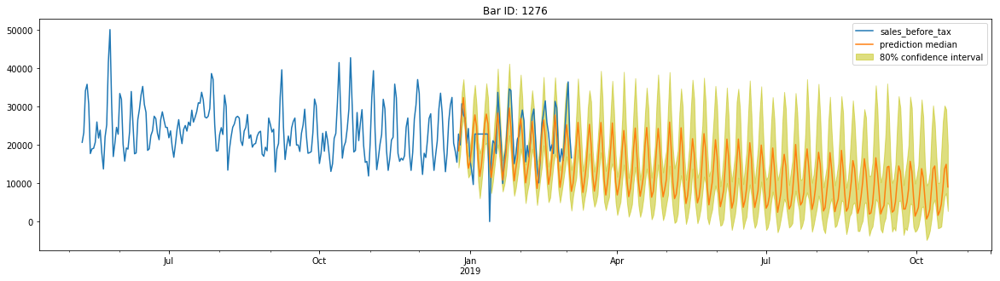

RMS Error:  7345.463289761095
Corr. Coef. =  71.14989662931347


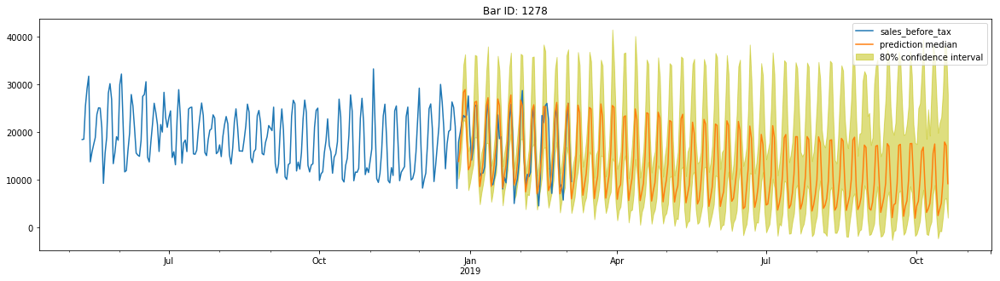

RMS Error:  22201.328584374212
Corr. Coef. =  53.20699628427358


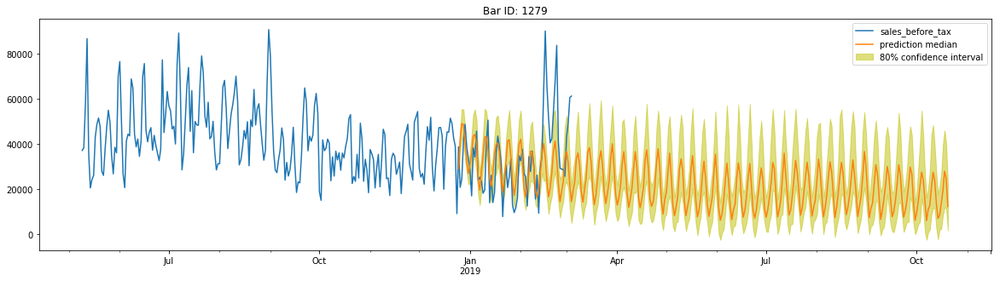

RMS Error:  818.0523099476127
Corr. Coef. =  32.06268993550594


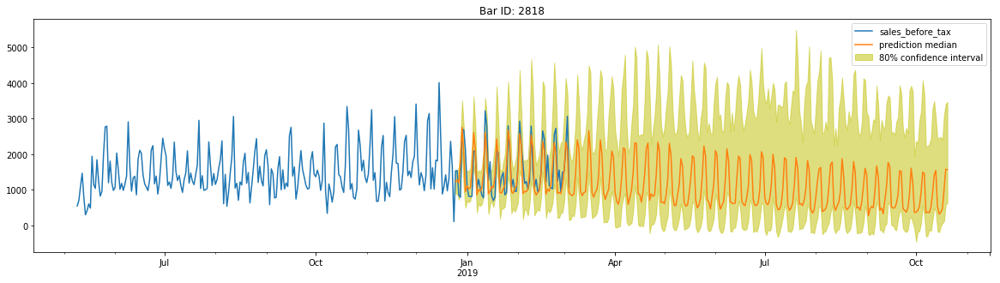

RMS Error:  3027.58404007075
Corr. Coef. =  45.42947268673812


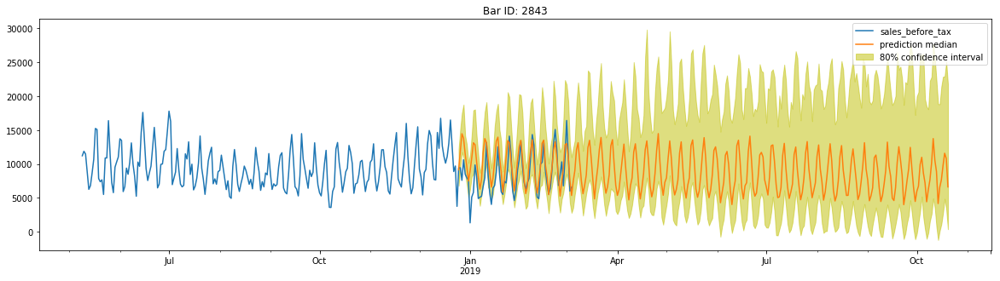

RMS Error:  1447.4121084950307
Corr. Coef. =  14.581321975391717


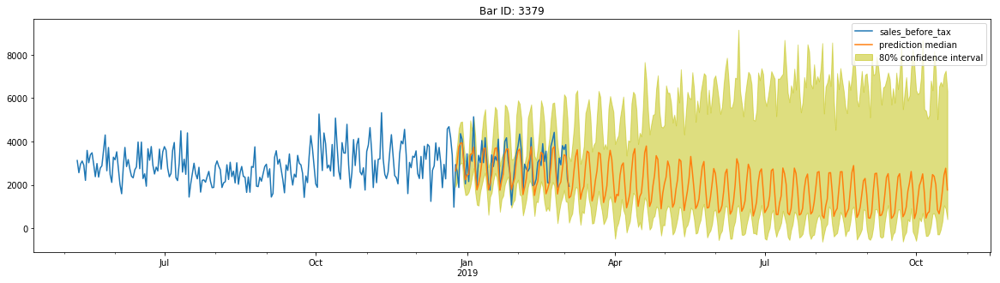

RMS Error:  8370.494801034902
Corr. Coef. =  2.4495142309194393


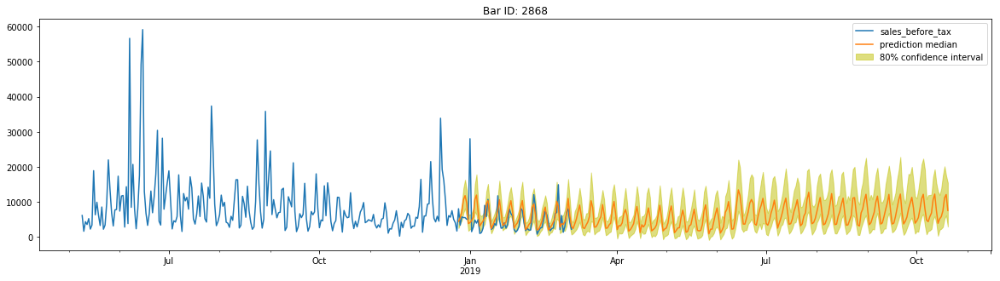

RMS Error:  2882.6787330106254
Corr. Coef. =  21.547104062182523


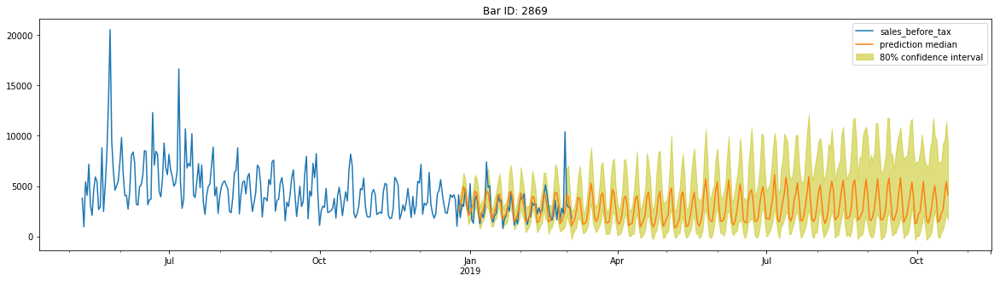

RMS Error:  8422.159395101324
Corr. Coef. =  -64.2865469042979


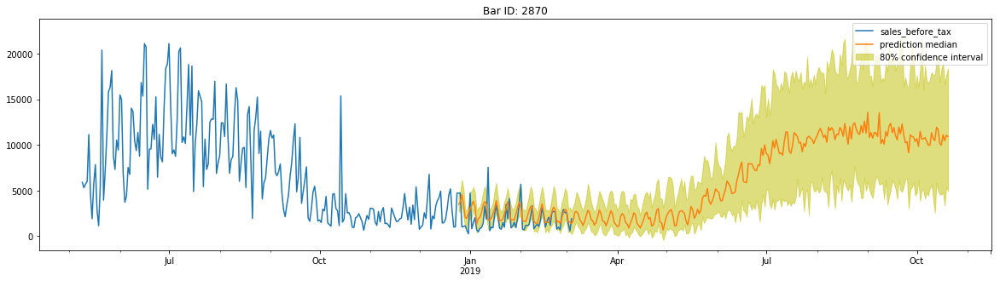

RMS Error:  3207.3001759951053
Corr. Coef. =  37.68941154173315


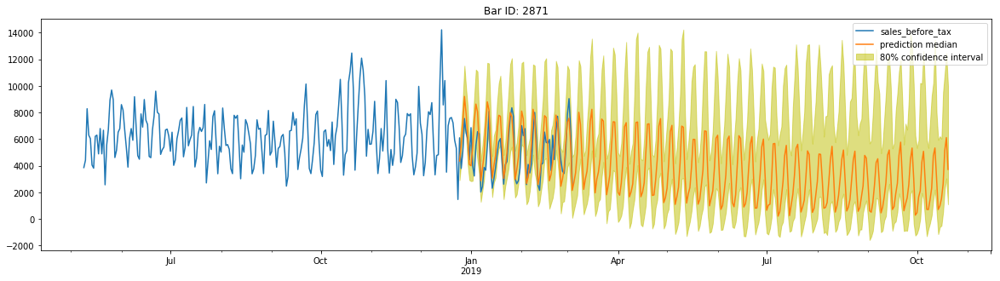

RMS Error:  1405.3334068958143
Corr. Coef. =  18.387233336225272


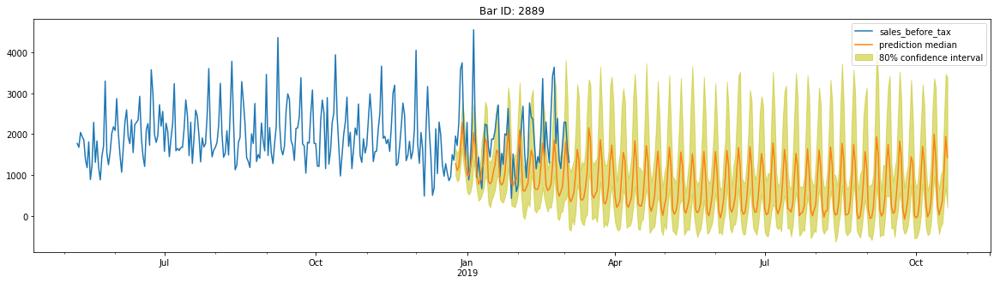

RMS Error:  2443.991168427922
Corr. Coef. =  24.035479460648045


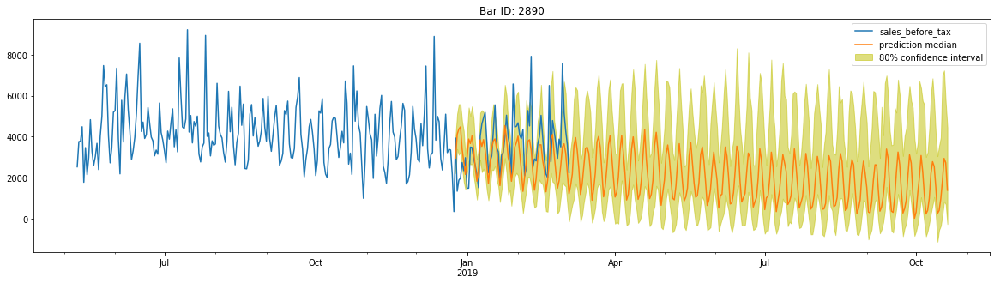

RMS Error:  3026.182888921421
Corr. Coef. =  43.549227504911656


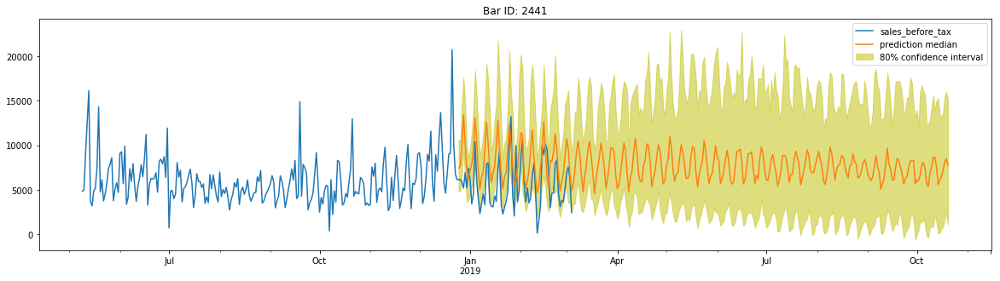

RMS Error:  2226.385486367186
Corr. Coef. =  35.30711333151828


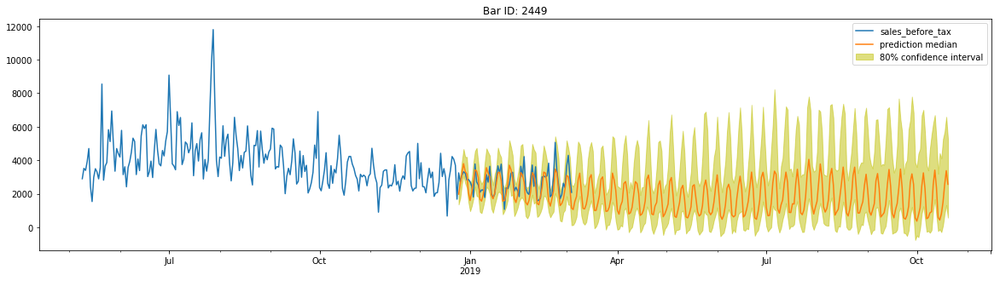

RMS Error:  2447.8526375027814
Corr. Coef. =  45.07333413142976


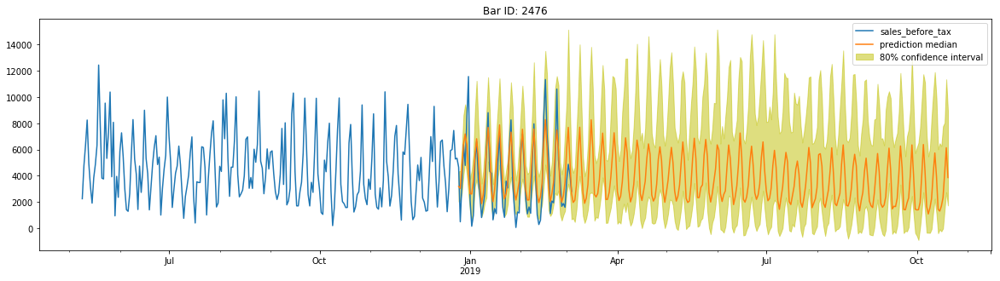

RMS Error:  7668.936762565427
Corr. Coef. =  8.068750823206774


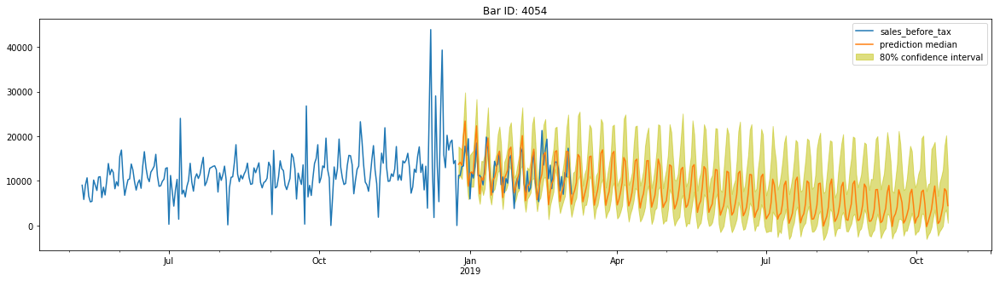

RMS Error:  5697.005264124636
Corr. Coef. =  -52.04798090743049


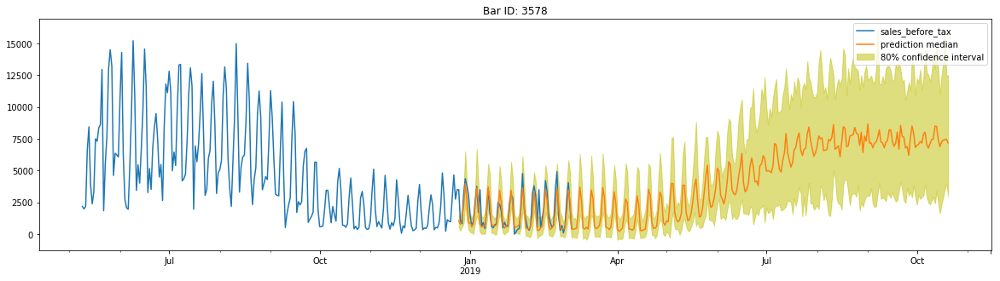

In [111]:
rmse_list = []
ccoef_list = []
for k in range(len(list_of_df)):
    plt.figure(figsize=(20,5))
    actual_data[k][-prediction_length:].plot(label='sales_before_tax')
    p10 = list_of_df[k]['0.1']
    p90 = list_of_df[k]['0.9']
    plt.fill_between(p10.index, p10, p90, color='y', alpha=0.5, label='80% confidence interval')
    list_of_df[k]['0.5'].plot(label='prediction median')
        
    rmse = sqrt(mean_squared_error(actual_data[k][-prediction_length:], list_of_df[k]['0.5']))
    ccoef = 100*np.corrcoef(actual_data[k][-prediction_length:].T,list_of_df[k]['0.5'].T)[0,1]
    rmse_list.append(rmse)
    ccoef_list.append(ccoef)
    
    print('RMS Error: ',rmse)
    print('Corr. Coef. = ',ccoef)   
    
    plt.legend()
    plt.title('Bar ID: '+str(barnames[k]))
    plt.show()

In [753]:
print(sum(rmse_list)/(len(rmse_list)))
print(sum(ccoef_list)/len(ccoef_list))

2926.808589078814
64.65147475359572


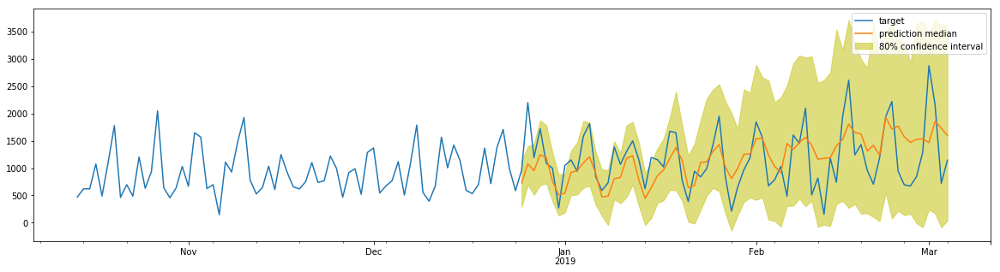

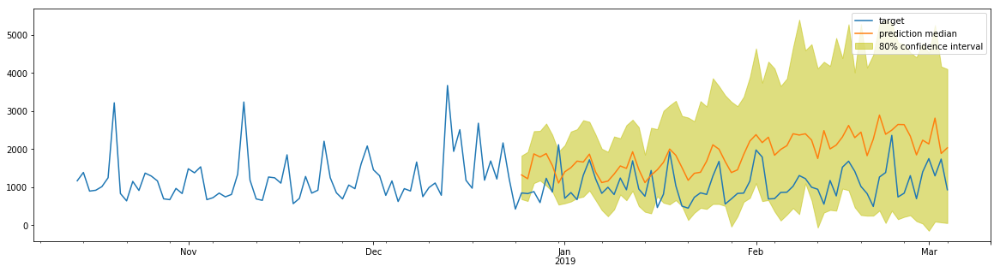

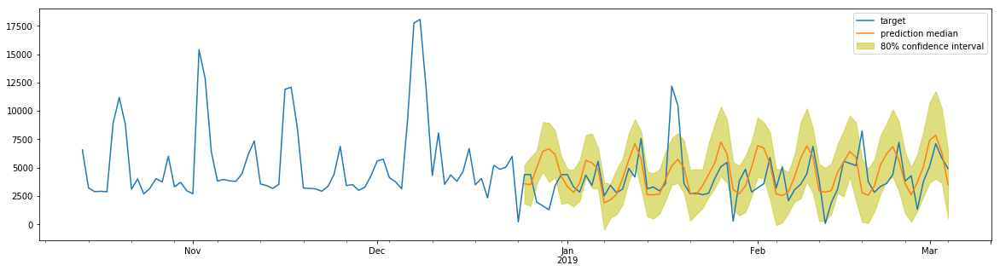

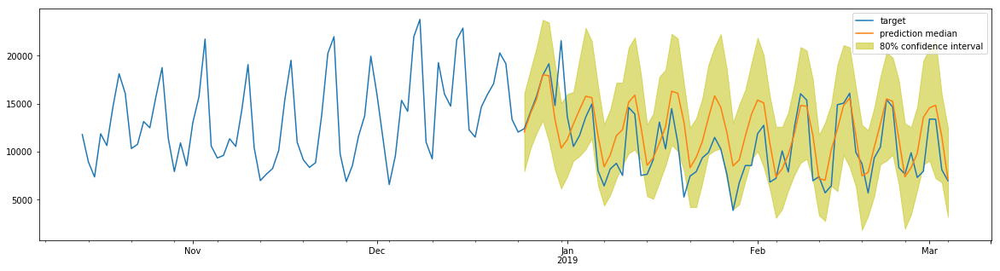

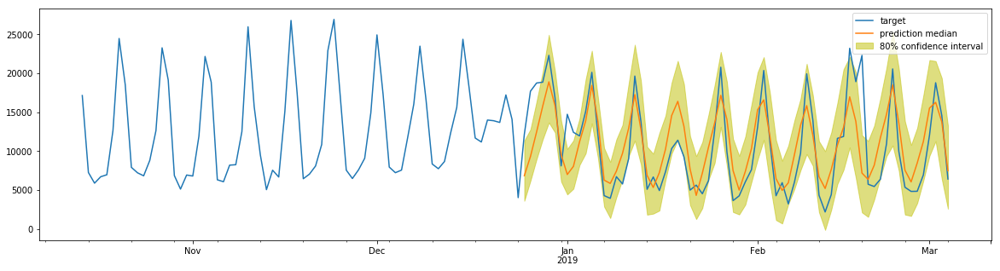

...

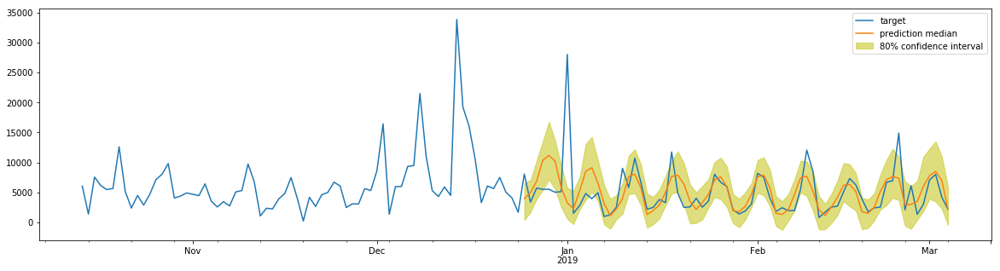

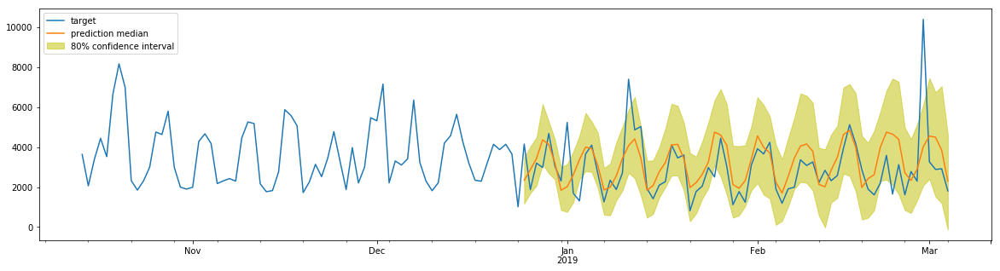

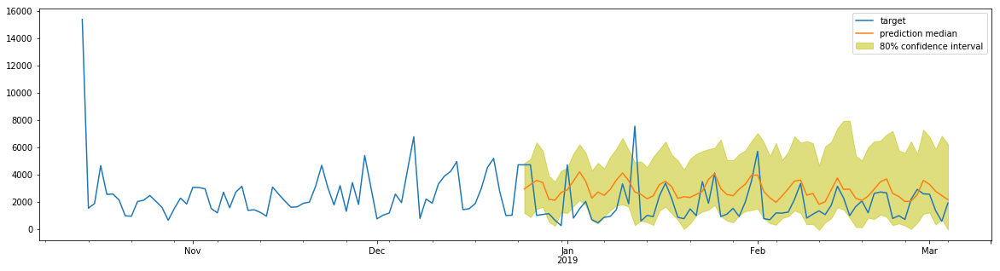

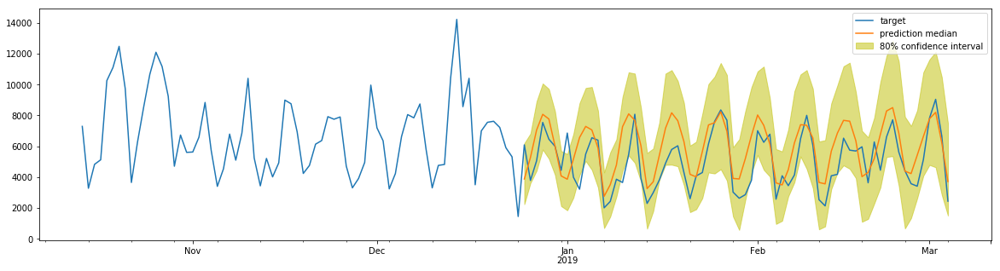

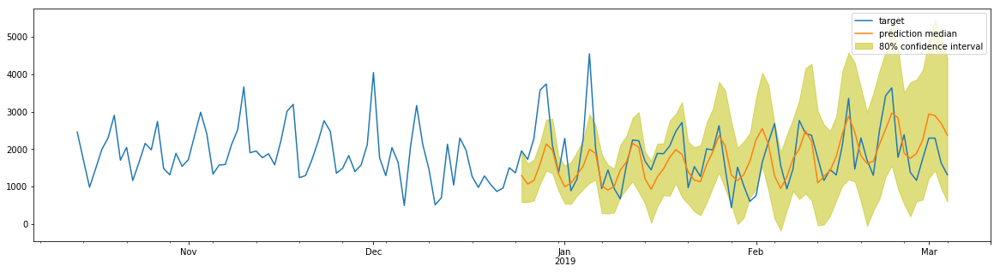

In [683]:
for k in range(len(list_of_df)):
    plt.figure(figsize=(20,5))
    actual_data[k][-prediction_length-context_length:].plot(label='target')
    p10 = list_of_df[k]['0.1']
    p90 = list_of_df[k]['0.9']
    plt.fill_between(p10.index, p10, p90, color='y', alpha=0.5, label='80% confidence interval')
    list_of_df[k]['0.5'].plot(label='prediction median')
    plt.legend()
    plt.show()

# Create DF with last year info

In [165]:
import pandas as pd

df_preds_lastyear = pd.DataFrame()
start = list_of_df[0].index[0]-pd.DateOffset(years=1)
end = list_of_df[0].index[-1]-pd.DateOffset(years=1)

for idx, bar in enumerate(barnames):
#     testdf = pd.DataFrame()
    testdf = list_of_df[idx]['0.5']
    testdf = testdf.reset_index()
    testdf.columns = ['order_time','predicted_sale']
    testdf.set_index('order_time', inplace=True)
#     testdf['predicted_sale'] = list_of_df[idx]['0.5'].values

    #############
    lastyear = time_series_training[idx]
    lastyear = lastyear[((lastyear.index >= start)&(lastyear.index <= end))]    
    tmp = lastyear.reset_index()
    tmp.columns = ['order_time','sales_before_tax']

    test1 = testdf[['predicted_sale']]
    test1['last_year_date'] = tmp['order_time'].values
    test1['last_year_sale'] = tmp['sales_before_tax'].values
    test1['bar_id'] = bar
    df_preds_lastyear = pd.concat([df_preds_lastyear,test1], axis=0)


In [167]:
df_preds_lastyear.tail()

,predicted_sale,last_year_date,last_year_sale,bar_id
order_time,,,,
2019-12-25,618.993774,2018-12-25,3494.849669,3578
2019-12-26,859.274353,2018-12-26,994.120000,3578
2019-12-27,1763.699341,2018-12-27,820.160000,3578
2019-12-28,2586.981201,2018-12-28,3130.900000,3578
2019-12-29,1707.631592,2018-12-29,4370.080000,3578


# Dynamo

In [170]:
from __future__ import print_function # Python 2/3 compatibility
import boto3

dynamodb = boto3.resource('dynamodb', region_name='us-east-1')#, endpoint_url="http://localhost:8000")
table_daily = dynamodb.Table('daily')
table_weekly = dynamodb.Table('weekly')
table_monthly = dynamodb.Table('monthly')

In [264]:
from __future__ import print_function # Python 2/3 compatibility
import boto3

dynamodb = boto3.resource('dynamodb', region_name='us-east-1')#, endpoint_url="http://localhost:8000")


table = dynamodb.create_table(
    TableName='DailySalesPrediction',
    KeySchema=[
        {
            'AttributeName': 'bar_id',
            'KeyType': 'HASH'  #Partition key
        },
        {
            'AttributeName': 'date',
            'KeyType': 'RANGE'  #Sort key
        }
    ],
    AttributeDefinitions=[
        {
            'AttributeName': 'bar_id',
            'AttributeType': 'S'
        },
        {
            'AttributeName': 'date',
            'AttributeType': 'S'
        },

    ],
    ProvisionedThroughput={
        'ReadCapacityUnits': 10,
        'WriteCapacityUnits': 10
    }
)

print("Table status:", table.table_status)
table_daily = dynamodb.Table('DailySalesPrediction')
table_weekly = dynamodb.Table('WeeklySalesPrediction')
table_monthly = dynamodb.Table('MonthlySalesPrediction')



Table status: CREATING


In [266]:
for bar in barnames:
    df1 = df_preds_lastyear[df_preds_lastyear['bar_id']==bar]
    
    ####
    df1 = df1[['predicted_sale','last_year_sale']]
    df1w = df1.resample("w").agg({'predicted_sale':np.sum,'last_year_sale':np.sum})
    df1m = df1.resample("m").agg({'predicted_sale':np.sum,'last_year_sale':np.sum})
    
    df1['dif'] = 100*((df1['predicted_sale']-df1['last_year_sale'])/df1['last_year_sale'])
    df1w['dif'] = 100*((df1w['predicted_sale']-df1w['last_year_sale'])/df1w['last_year_sale'])
    df1m['dif'] = 100*((df1m['predicted_sale']-df1m['last_year_sale'])/df1m['last_year_sale'])

    decimals = 2    
    df1['predicted_sale'] = df1['predicted_sale'].apply(lambda x: round(x, decimals))
    df1w['predicted_sale'] = df1w['predicted_sale'].apply(lambda x: round(x, decimals))
    df1m['predicted_sale'] = df1m['predicted_sale'].apply(lambda x: round(x, decimals))

    df1['last_year_sale'] = df1['last_year_sale'].apply(lambda x: round(x, decimals))
    df1w['last_year_sale'] = df1w['last_year_sale'].apply(lambda x: round(x, decimals))
    df1m['last_year_sale'] = df1m['last_year_sale'].apply(lambda x: round(x, decimals))
    
    df1['dif'] = df1['dif'].apply(lambda x: round(x, decimals))
    df1w['dif'] = df1w['dif'].apply(lambda x: round(x, decimals))
    df1m['dif'] = df1m['dif'].apply(lambda x: round(x, decimals))
        
    
    df1dic = df1.to_dict('record')
    df1wdic = df1w.to_dict('record')
    df1mdic = df1m.to_dict('record')
    
    for idx in range(len(df1)):

        #######
        #day:
        df1dicind = df1dic[idx]
        df1ind = df1.index[idx]
        df1dicind = df1dic[idx]
        df1dicind['Day']= df1ind.strftime("%d %B")[:6]
        df1ind = str(df1.index[idx])[:10]
        df1dicind = str(df1dicind)
        df1dicind = df1dicind.replace('\'', '"')

        table_daily.put_item(
           Item={
               'bar_id': str(bar),
               'date': df1ind,
               'sales' : df1dicind
            }
        )
    for idx in range(len(df1w)):
        #####
        #week:
        df1dicind = df1wdic[idx]
        df1ind = df1w.index[idx]
        thisweek = df1ind.strftime("%d %B")[:6]
        lastweek = df1ind-pd.DateOffset(weeks=1)
        lastweek = lastweek.strftime("%d %B")[:6]
        week = lastweek+'-'+ thisweek
        df1dicind['Week']= week
        df1ind = str(df1w.index[idx])[:10]
        df1dicind = str(df1dicind)
        df1dicind = df1dicind.replace('\'', '"')

        table_weekly.put_item(
           Item={
               'bar_id': str(bar),
               'date': df1ind,
               'sales' : df1dicind
            }
        )
    for idx in range(len(df1m)):
        
        ####
        #month:
        df1dicind = df1mdic[idx]
        df1ind = df1m.index[idx]
        month = df1ind.strftime("%B")[:3]
        df1dicind['Month']= month
        df1dicind = str(df1dicind)
        df1ind = str(df1m.index[idx])[:10]
        df1dicind = df1dicind.replace('\'', '"')

        table_monthly.put_item(
           Item={
               'bar_id': str(bar),
               'date': df1ind,
               'sales' : df1dicind
            }
        )